In [1]:
%load_ext autoreload
%autoreload 2

# import intake
import numpy as np
import netCDF4 as nc
import xarray as xr
import os
from matplotlib import pyplot as plt
import xesmf as xe
import pandas as pd
import pickle
import cartopy.crs as ccrs
import cartopy.feature as cfeature
# import matplotlib.ticker as mticker
# from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from gfdl_grid_paper import *
import momlevel
import glob
import cf_xarray as cfxr
from scipy.interpolate import griddata

In [2]:
inputdir='/glade/work/clittle/p2521/input/'
inputdir2='/glade/work/clittle/p2521/'
modeldir='model/'
# ds_grid = xr.open_dataset(inputdir+modeldir+'ESM4_ocean_static.nc')
# ds_grid_esm4=ds_grid[['geolon','geolat','geolon_c','geolat_c','wet','areacello', 'deptho']]

In [3]:
tgcsvin = './tg_locs_gs.csv'
# temp

In [4]:
margin = 2

def cutdomain(ds, margin):
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError("Latitude or longitude coordinate not found in the dataset.")
   
    # Ensure that latitude and longitude arrays are computed before using them for indexing
    ds[lat_name] = ds[lat_name].compute()
    ds[lon_name] = ds[lon_name].compute()

    # Apply the margin-based conditions using the detected latitude and longitude names
    ds = ds.where(ds[lat_name] < max_lat + margin, drop=True)
    ds = ds.where(ds[lat_name] > min_lat - margin, drop=True)
    ds = ds.where(ds[lon_name] < max_lon + margin, drop=True)
    ds = ds.where(ds[lon_name] > min_lon - margin, drop=True)

    return ds

In [5]:
def model_dim_check(ds):
    if 'j' not in list(ds.dims):
        ds = ds.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
        
    if 'lat_bnds' in list(ds.keys()):
        ds = ds.rename({'lat_bnds':'vertices_latitude', 'lon_bnds':'vertices_longitude', 'vertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values

    if 'bounds_lat' in list(ds.keys()):
        ds = ds.rename({'bounds_lat':'vertices_latitude', 'bounds_lon':'vertices_longitude', 'nvertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values
        
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)
    
    if ds.sizes['i'] > ds.sizes['j']:
        print('i dimension is larger than j dimension. Therefore, dimension names need to be swapped')
        ds = ds.rename({'i':'i_temp', 'j':'j_temp'})
        ds = ds.rename({'i_temp':'j', 'j_temp':'i'})
        print('dimension names swapped')

    else:
        #ds.sizes['i'] < ds.sizes['j']
        print('no swapping of i and j dimensions')

    if ds[lon_name].min() < 0:
        print('longitude ranges from -180 to 180. This needs to be changed as 0 to 360')
        temp = ds[lon_name]
        temp = (temp+360)%360
        ds = ds.drop_vars('longitude')
        ds = ds.assign_coords(longitude=(['i', 'j'], temp.data))
        print('longitude values changed')

    return(ds)

In [6]:
%%time
# Define available models
mods = [
    #"DTU22",
    "HadGEM3-GC31-LL",  #picked for multimodel
    #"HadGEM3-GC31-MM",
    "HadGEM3-GC31-HM",  #picked for multimodel
    "CNRM-CM6-1",       #picked for multimodel
    "CNRM-CM6-1-HR",    #picked for multimodel
    "ECMWF-IFS-LR",     #picked for multimodel
    "ECMWF-IFS-MR",     #picked for multimodel 
    "EC-Earth3P",       #picked for multimodel
    "EC-Earth3P-HR",    #picked for multimodel
    #"GFDL-ESM4",
    #"GFDL-CM4",
    
    
    #"ECMWF-IFS-HR",
    # "CMCC-CM2-HR4",
    # "CMCC-CM2-VHR4",
    # "HadGEM3-GC31-HH"
]
ds_models_vo=[]
ds_models_uo=[]

ds_models_ws_mag = []
ds_models_tauu = []
ds_models_tauv = []
ds_models_tauu_seas = []
ds_models_tauv_seas = []

ds_models_zos = []



source_ids = mods#[4:6]
for i in range(len(source_ids)):
    source_id=source_ids[i]
    #if (source_id=="DTU22"):
     #   ds_zos = xr.open_dataset("/glade/work/clittle/p2521/input/obs/dtuuh22mdt.nc")
    #else:
    #    if (source_id=="GFDL-ESM4") or (source_id=="GFDL-CM4"):
    #        ds_zos = xr.open_mfdataset(inputdir2+'zos_Omon_'+source_id+'*.nc')
    #        ds_zos = ds_zos.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
    filepath_vo = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_vo/'
    ds_vo_flist1 = sorted(glob.glob(filepath_vo+f'/vo_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
    ds_vo_flist2 = sorted(glob.glob(filepath_vo+f'/vo_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
    ds_vo_flist3 = sorted(glob.glob(filepath_vo+f'/vo_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
    ds_vo_flist = (ds_vo_flist1+ds_vo_flist2+ds_vo_flist3)
    ds_vo = xr.open_mfdataset(ds_vo_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
    ds_vo = model_dim_check(ds_vo)

    filepath_uo = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_uo/'
    ds_uo_flist1 = sorted(glob.glob(filepath_uo+f'/uo_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
    ds_uo_flist2 = sorted(glob.glob(filepath_uo+f'/uo_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
    ds_uo_flist3 = sorted(glob.glob(filepath_uo+f'/uo_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
    ds_uo_flist = (ds_uo_flist1+ds_uo_flist2+ds_uo_flist3)
    ds_uo = xr.open_mfdataset(ds_uo_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
    ds_uo = model_dim_check(ds_uo)

    ## Read in wind data

    filepath_v = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_tauvo/'
    ds_tauv_flist1 = sorted(glob.glob(filepath_v+f'/tauvo_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
    ds_tauv_flist2 = sorted(glob.glob(filepath_v+f'/tauvo_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
    ds_tauv_flist3 = sorted(glob.glob(filepath_v+f'/tauvo_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
    ds_tauv_flist = (ds_tauv_flist1+ds_tauv_flist2+ds_tauv_flist3)
    ds_tauv = xr.open_mfdataset(ds_tauv_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
    #ds_tauv = model_dim_check(ds_tauv)

    filepath_u = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_tauuo/'
    ds_tauu_flist1 = sorted(glob.glob(filepath_u+f'/tauuo_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
    ds_tauu_flist2 = sorted(glob.glob(filepath_u+f'/tauuo_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
    ds_tauu_flist3 = sorted(glob.glob(filepath_u+f'/tauuo_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
    ds_tauu_flist = (ds_tauu_flist1+ds_tauu_flist2+ds_tauu_flist3)
    ds_tauu = xr.open_mfdataset(ds_tauu_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
    
    mag = np.sqrt((ds_tauu.tauuo**2) + (ds_tauv.tauvo**2))
    temp = ds_tauu
    temp = temp.assign(mag=mag)
    ws_mag = temp
    ws_mag = model_dim_check(ws_mag)
    ds_tauu = model_dim_check(ds_tauu)
    ds_tauv = model_dim_check(ds_tauv)

    ## Read in Sea Level Data
    filepath = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_zos/'
    ds_zos_flist1 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
    ds_zos_flist2 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
    ds_zos_flist3 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
    ds_zos_flist = (ds_zos_flist1+ds_zos_flist2+ds_zos_flist3)
    ds_zos = xr.open_mfdataset(ds_zos_flist)        # print(i)

    ds_zos = model_dim_check(ds_zos)
    
    # #Select region of interest IF regridding
    min_lon = 260
    max_lon = 320
    min_lat = 15
    max_lat = 60
    min_lon = 260
    max_lon = 360
    min_lat = 15
    max_lat = 75
    # max_lat = 20
    
    #ds_zos   = cutdomain(ds_zos, margin)
    #ds_vo    = cutdomain(ds_vo, margin)
    #ds_uo    = cutdomain(ds_uo, margin)
    #ds_tauv  = cutdomain(ds_tauv, margin)
    #ds_tauu  = cutdomain(ds_tauu, margin)
    

    #if (source_id=="DTU22"):
    #    ds_model = ds_zos.rename({'mdt':'zos'}).drop_vars('err_mdt')
    #else:
    ds_model_vo = ds_vo.groupby("time.year").mean().sel(year=slice('1993','2012'))
    ds_model_vo = ds_model_vo.mean(dim='year').compute()

    ds_model_uo = ds_uo.groupby("time.year").mean().sel(year=slice('1993','2012'))
    ds_model_uo = ds_model_uo.mean(dim='year').compute()

    # Get surface currents
    #surf_vo = ds_model_vo.isel(lev = 0)
    #surf_uo = ds_model_uo.isel(lev = 0)

    # Find Ocean Bottom Velocty
    if i in [3, 6, 7]:
        valid_mask = (ds_model_vo['vo'].notnull()) & (ds_model_vo['vo'] != 0.0)
        bottom_index = valid_mask.sum(dim="lev") - 1
        bottom_vo = ds_model_vo['vo'].where(valid_mask).isel(lev=bottom_index)

        valid_mask = (ds_model_uo['uo'].notnull()) & (ds_model_uo['uo'] != 0.0)
        bottom_index = valid_mask.sum(dim="lev") - 1
        bottom_uo = ds_model_uo['uo'].where(valid_mask).isel(lev=bottom_index)

    else:
        bottom_vo = ds_model_vo['vo'].where(ds_model_vo['vo'].notnull()).isel(lev=ds_model_vo['vo'].notnull().sum('lev') - 1)
        bottom_uo = ds_model_uo['uo'].where(ds_model_uo['uo'].notnull()).isel(lev=ds_model_uo['uo'].notnull().sum('lev') - 1)

    # Assign to a new variable for clarity
    ds_model_vo['bottom_vo'] = bottom_vo
    ds_model_uo['bottom_uo'] = bottom_uo

    ds_model_vo.load()
    ds_model_uo.load()

    #surf_vo.load()
    #surf_uo.load()
    
    ds_models_vo.append(ds_model_vo)
    ds_models_uo.append(ds_model_uo)

    #surfs_vo.append(surf_vo)
    #surfs_uo.append(surf_uo)
    
    print('Done with currents ' + source_ids[i])

    ds_model_zos = ds_zos.groupby("time.year").mean().sel(year=slice('1993','2012'))
    ds_model_zos=ds_model_zos.mean(dim='year').compute()  
    ds_model_zos.load()
    ds_models_zos.append(ds_model_zos)
    
    print('Done with mdsl ' + source_ids[i])


    ds_model_ws_mag = ws_mag.groupby("time.year").mean().sel(year=slice('1993','2012'))
    ds_model_tauu = ds_tauu.groupby("time.year").mean().sel(year=slice('1993','2012'))
    ds_model_tauv = ds_tauv.groupby("time.year").mean().sel(year=slice('1993','2012'))
       
    ds_model_ws_mag=ds_model_ws_mag.mean(dim='year').load()
    ds_model_tauu=ds_model_tauu.mean(dim='year').load()
    ds_model_tauv=ds_model_tauv.mean(dim='year').load()

    ds_tauu_timeslice = ds_tauu.sel(time=slice('1993','2012'))
    ds_tauv_timeslice = ds_tauv.sel(time=slice('1993','2012'))
    
    ds_model_tauu_seas=ds_tauu_timeslice.groupby("time.month").mean(dim="time").compute()
    ds_model_tauv_seas=ds_tauv_timeslice.groupby("time.month").mean(dim="time").compute()

    ds_models_ws_mag.append(ds_model_ws_mag)
    
    ds_models_tauu.append(ds_model_tauu)
    ds_models_tauv.append(ds_model_tauv)

    ds_models_tauu_seas.append(ds_model_tauu_seas)
    ds_models_tauv_seas.append(ds_model_tauv_seas)
    
    
    print('Done with wind ' + source_ids[i])
    
# ds_models

i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as

In [7]:
1+1

2

In [8]:
# Read in DTU22 data
dtu_zos = xr.open_dataset("/glade/work/clittle/p2521/input/obs/dtuuh22mdt.nc")
dtu_zos = dtu_zos.rename({'mdt':'zos'}).drop_vars('err_mdt')

In [9]:
print(dtu_zos)

<xarray.Dataset>
Dimensions:    (latitude: 1313, longitude: 2881)
Coordinates:
  * longitude  (longitude) float64 0.0 0.125 0.25 0.375 ... 359.8 359.9 360.0
  * latitude   (latitude) float64 -79.0 -78.88 -78.75 ... 84.75 84.88 85.0
Data variables:
    zos        (latitude, longitude) float64 ...


In [10]:
ds_bathy = xr.open_dataset(inputdir+"/obs/GEBCO.nc")
ds_bathy= cutdomain(ds_bathy, margin)

In [14]:
import xarray as xr
import matplotlib.pyplot as plt

depth_maps = []
for i, ds_model in enumerate(ds_models_vo):
    # Get `uo` variable and depth levels
    uo = ds_model['vo']
    lev = ds_model['lev']

    if i in [3, 6, 7]:
        valid_mask = (uo.notnull()) & (uo != 0.0)
    else:
        valid_mask = uo.notnull()

    bottom_index = valid_mask.sum(dim="lev") - 1

    # Broadcast depth levels to the shape of uo
    lev_expanded = lev.broadcast_like(uo)

    # Select bottom depth
    bottom_depth = lev_expanded.where(valid_mask).isel(lev=bottom_index)

    # Save result
    depth_maps.append(bottom_depth)


In [15]:
depth_maps[0]

<xarray.DataArray 'lev' (i: 330, j: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    lev        (i, j) float64 5.902e+03 5.902e+03 ... 5.902e+03 5.902e+03
  * i          (i) int32 0 1 2 3 4 5 6 7 8 ... 322 323 324 325 326 327 328 329
  * j          (j) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    latitude   (i, j) float32 -84.06 -84.06 -84.06 -84.06 ... 50.51 50.23 50.01
    longitude  (i, j) float32 73.5 74.5 75.5 76.5 77.5 ... 73.0 73.0 73.0 73.0
Attributes:
    bounds:         lev_bnds
    units:          m
    axis:           Z
    positive:       down
    long_name:      ocean depth coordinate
    standard_name:  depth

/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner

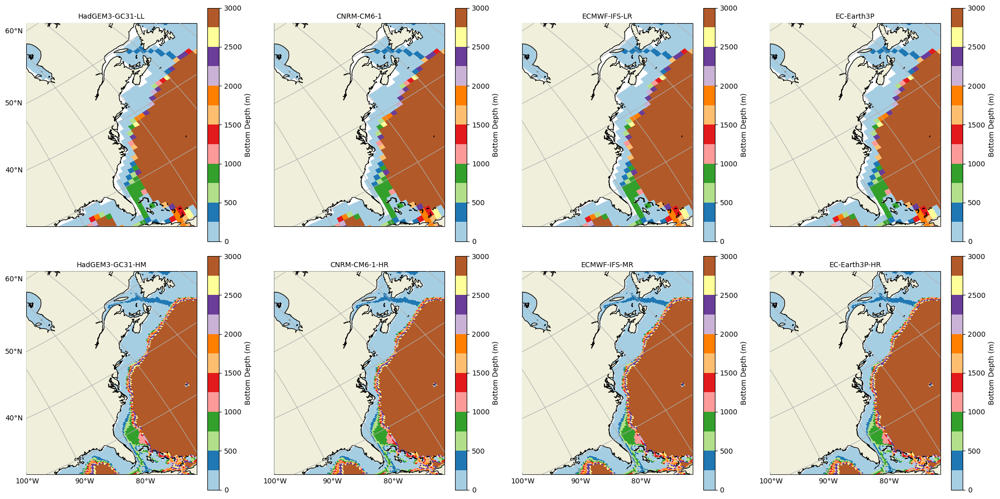

In [34]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

rotated_crs = ccrs.RotatedPole(pole_longitude=30, pole_latitude=60)

titles = source_ids
vmin = 0
vmax = 3000  # Adjust based on your ocean depth range

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10),
                         subplot_kw={'projection': rotated_crs})

plot_order = [0, 2, 4, 6, 1, 3, 5, 7]

for n, i in enumerate(plot_order):
    row = n // 4
    col = n % 4
    ax = axes[row, col]

    depth_map = depth_maps[i]
    lon = ds_models_uo[i].longitude
    lat = ds_models_uo[i].latitude

    pcm = ax.pcolormesh(lon, lat, depth_map, vmin=vmin, vmax=vmax,
                        cmap="Paired", shading="auto", transform=ccrs.PlateCarree())

    # Optional: overlay 200m isobath from your bathymetry
    #CS_bathy = ax.contour(ds_bathy.longitude, ds_bathy.latitude, ds_bathy.depth, 
    #                      levels=[-200], colors='blue', linewidths=1.5, 
    #                      zorder=3, transform=ccrs.PlateCarree())

    ax.set_extent([-75, -71, 20, 60], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('110m'), zorder=4)
    ax.add_feature(cfeature.COASTLINE, edgecolor="black", zorder=4)
    ax.set_title(titles[i], fontsize=10)

    if col == 0:
        ax.set_ylabel("Latitude")
    if row == 1:
        ax.set_xlabel("Longitude")

    gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
    gl.xlabels_bottom = (row == 1)
    gl.ylabels_left = (col == 0)

    fig.colorbar(pcm, ax=ax, orientation="vertical", label="Bottom Depth (m)")

plt.tight_layout()
plt.show()


In [13]:
import xarray as xr
import matplotlib.pyplot as plt

depth_maps = []
for i, ds_model in enumerate(ds_models_uo):
    # Get `uo` variable and depth levels
    uo = ds_model['uo']
    lev = ds_model['lev']

    if i in [1, 2, 3]:
        valid_mask = (uo.notnull()) & (uo != 0.0)
    else:
        valid_mask = uo.notnull()

    bottom_index = valid_mask.sum(dim="lev") - 1

    # Broadcast depth levels to the shape of uo
    lev_expanded = lev.broadcast_like(uo)

    # Select bottom depth
    bottom_depth = lev_expanded.where(valid_mask).isel(lev=bottom_index)

    # Save result
    depth_maps.append(bottom_depth)


/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner

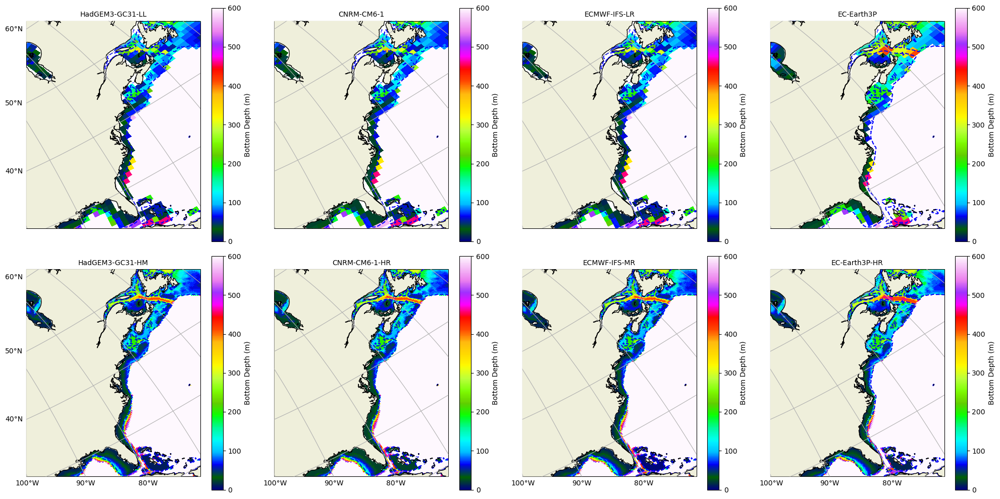

In [14]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

rotated_crs = ccrs.RotatedPole(pole_longitude=30, pole_latitude=60)

titles = source_ids
vmin = 0
vmax = 600  # Adjust based on your ocean depth range

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10),
                         subplot_kw={'projection': rotated_crs})

plot_order = [0, 2, 4, 6, 1, 3, 5, 7]

for n, i in enumerate(plot_order):
    row = n // 4
    col = n % 4
    ax = axes[row, col]

    depth_map = depth_maps[i]
    lon = ds_models_uo[i].longitude
    lat = ds_models_uo[i].latitude

    pcm = ax.pcolormesh(lon, lat, depth_map, vmin=vmin, vmax=vmax,
                        cmap="gist_ncar", shading="auto", transform=ccrs.PlateCarree())

    # Optional: overlay 200m isobath from your bathymetry
    CS_bathy = ax.contour(ds_bathy.longitude, ds_bathy.latitude, ds_bathy.depth, 
                          levels=[-200], colors='blue', linewidths=1.5, 
                          zorder=3, transform=ccrs.PlateCarree())

    ax.set_extent([-75, -71, 20, 60], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('110m'), zorder=4)
    ax.add_feature(cfeature.COASTLINE, edgecolor="black", zorder=4)
    ax.set_title(titles[i], fontsize=10)

    if col == 0:
        ax.set_ylabel("Latitude")
    if row == 1:
        ax.set_xlabel("Longitude")

    gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
    gl.xlabels_bottom = (row == 1)
    gl.ylabels_left = (col == 0)

    fig.colorbar(pcm, ax=ax, orientation="vertical", label="Bottom Depth (m)")

plt.tight_layout()
plt.show()


/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner

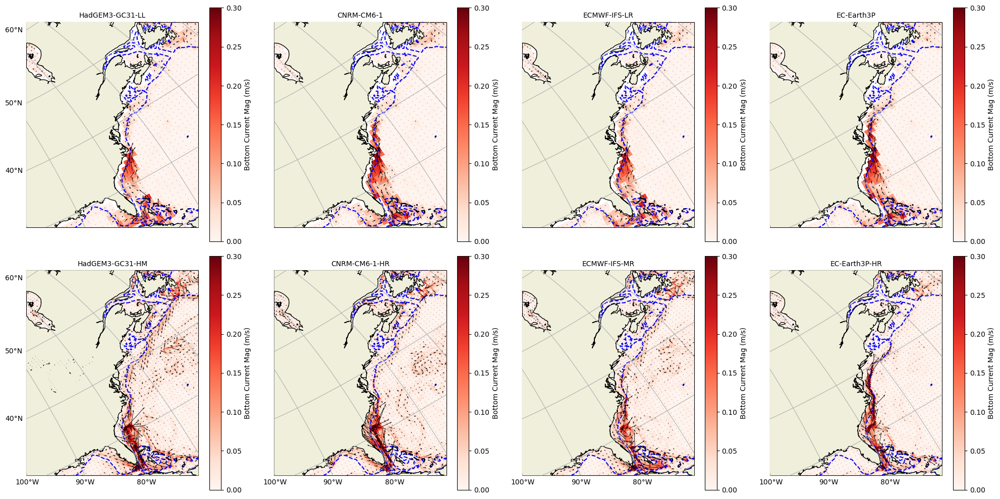

In [15]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

rotated_crs = ccrs.RotatedPole(pole_longitude=30, pole_latitude=60)

variable_name_u = "bottom_uo"
variable_name_v = "bottom_vo"

titles = source_ids
vmin = 0
vmax = 0.3

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10),
                         subplot_kw={'projection': rotated_crs})

# Define the custom plotting order: [0, 2, 4, 6, 1, 3, 5, 7]
plot_order = [0, 2, 4, 6, 1, 3, 5, 7]

for n, i in enumerate(plot_order):
    row = n // 4
    col = n % 4
    ax = axes[row, col]

    ds_u = ds_models_uo[i]
    ds_v = ds_models_vo[i]
    
    tauu = ds_u[variable_name_u]
    tauv = ds_v[variable_name_v]
    lon = ds_u.longitude
    lat = ds_u.latitude

    mag = (tauu**2 + tauv**2) ** 0.5

    pcm = ax.pcolormesh(lon, lat, mag, vmin=vmin, vmax=vmax,
                        cmap="Reds", shading="auto", transform=ccrs.PlateCarree())

    stride = 1 if i in (0, 2, 4, 6) else 3
    tauu_q = tauu.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    tauv_q = tauv.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    lon_q = lon.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    lat_q = lat.isel(i=slice(None, None, stride), j=slice(None, None, stride))

    ax.quiver(lon_q.values, lat_q.values, 
              tauu_q.values, tauv_q.values,
              scale=3, color="black", zorder=5, transform=ccrs.PlateCarree())

    CS_bathy = ax.contour(ds_bathy.longitude, ds_bathy.latitude, ds_bathy.depth, 
                          levels=[-200], colors='blue', linewidths=1.5, 
                          zorder=3, transform=ccrs.PlateCarree())

    ax.set_extent([-75, -71, 20, 60], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('110m'), zorder=4)
    ax.add_feature(cfeature.COASTLINE, edgecolor="black", zorder=4)
    ax.set_title(titles[i], fontsize=10)

    if col == 0:
        ax.set_ylabel("Latitude")
    if row == 1:
        ax.set_xlabel("Longitude")

    gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
    gl.xlabels_bottom = (row == 1)
    gl.ylabels_left = (col == 0)

    # Add colorbar to each subplot (or modify if you want a shared one)
    fig.colorbar(pcm, ax=ax, orientation="vertical", label="Bottom Current Mag (m/s)")

plt.tight_layout()
plt.show()


/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner

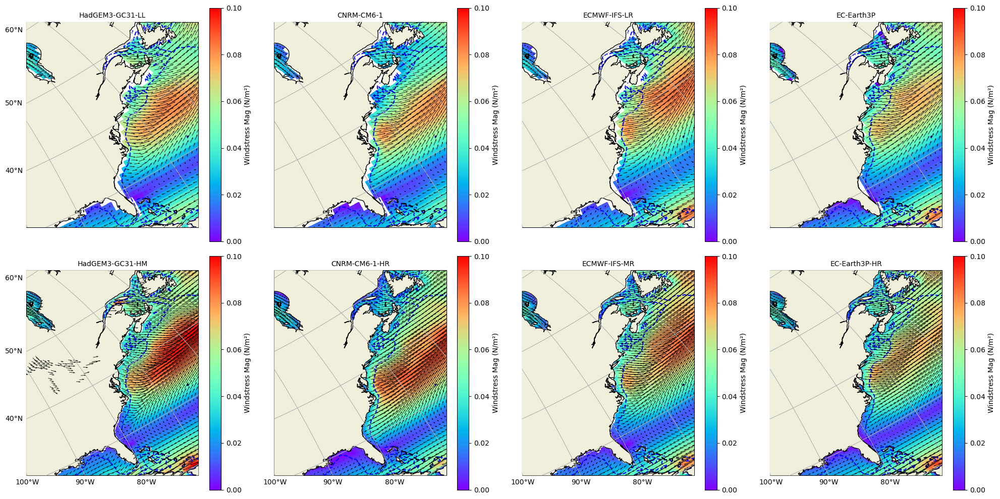

In [16]:
#%%time
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

variable_name_u = "tauuo"
variable_name_v = "tauvo"

titles = source_ids
vmin = 0
vmax = 0.1

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10),
                         subplot_kw={'projection': rotated_crs})

# Custom panel order: 1, 3, 5, 7, 2, 4, 6, 8
plot_order = [0, 2, 4, 6, 1, 3, 5, 7]

for n, i in enumerate(plot_order):
    row = n // 4
    col = n % 4
    ax = axes[row, col]

    ds_u = ds_models_tauu[i]
    ds_v = ds_models_tauv[i]

    tauu = ds_u[variable_name_u]
    tauv = ds_v[variable_name_v]
    lon = ds_u.longitude
    lat = ds_u.latitude

    mag = (tauu**2 + tauv**2) ** 0.5

    pcm = ax.pcolormesh(lon, lat, mag,
                        vmin=vmin, vmax=vmax,
                        cmap="rainbow", shading="auto",
                        transform=ccrs.PlateCarree())

    stride = 1 if i in (0, 2, 4, 6) else 3
    tauu_q = tauu.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    tauv_q = tauv.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    lon_q = lon.isel(i=slice(None, None, stride), j=slice(None, None, stride))
    lat_q = lat.isel(i=slice(None, None, stride), j=slice(None, None, stride))

    ax.quiver(lon_q.values, lat_q.values, 
              tauu_q.values, tauv_q.values,
              scale=1, color="black", zorder=5, transform=ccrs.PlateCarree())

    CS_bathy = ax.contour(ds_bathy.longitude, ds_bathy.latitude, ds_bathy.depth,
                          levels=[-200], colors='blue', linewidths=1.5,
                          zorder=3, transform=ccrs.PlateCarree())

    ax.set_extent([-75, -71, 20, 60], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('110m'), zorder=4)
    ax.add_feature(cfeature.COASTLINE, edgecolor="black", zorder=4)
    ax.set_title(titles[i], fontsize=10)

    if col == 0:
        ax.set_ylabel("Latitude")
    if row == 1:
        ax.set_xlabel("Longitude")

    gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
    gl.xlabels_bottom = (row == 1)
    gl.ylabels_left = (col == 0)

    fig.colorbar(pcm, ax=ax, orientation="vertical", label="Windstress Mag (N/m²)")

plt.tight_layout()
plt.show()


/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner

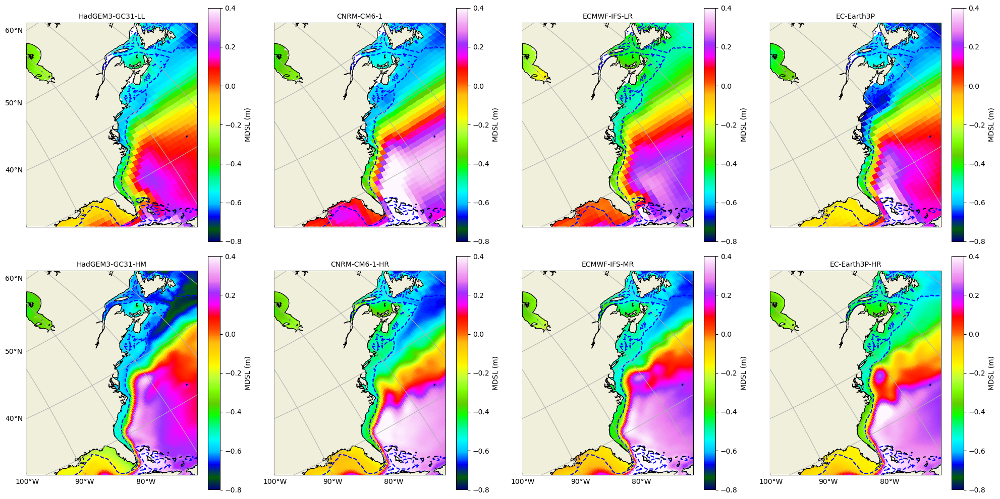

In [17]:
#%%time
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

variable_name = "zos"
titles = source_ids
vmin = -0.8
vmax = 0.4

rotated_crs = ccrs.RotatedPole(pole_longitude=30, pole_latitude=60)

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10),
                         subplot_kw={'projection': rotated_crs})

# Desired panel order
plot_order = [0, 2, 4, 6, 1, 3, 5, 7]

for n, i in enumerate(plot_order):
    row = n // 4
    col = n % 4
    ax = axes[row, col]

    ds = ds_models_zos[i]
    zos = ds[variable_name]
    lon = ds.longitude
    lat = ds.latitude

    pcm = ax.pcolormesh(lon, lat, zos,
                        vmin=vmin, vmax=vmax,
                        cmap="gist_ncar", shading="auto",
                        transform=ccrs.PlateCarree())

    CS_bathy = ax.contour(ds_bathy.longitude, ds_bathy.latitude, ds_bathy.depth,
                          levels=[-200], colors='blue', linewidths=1.5,
                          zorder=3, transform=ccrs.PlateCarree())

    ax.set_extent([-75, -71, 20, 60], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('110m'), zorder=4)
    ax.add_feature(cfeature.COASTLINE, edgecolor="black", zorder=4)
    ax.set_title(titles[i], fontsize=10)

    if col == 0:
        ax.set_ylabel("Latitude")
    if row == 1:
        ax.set_xlabel("Longitude")

    gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
    gl.xlabels_bottom = (row == 1)
    gl.ylabels_left = (col == 0)

    fig.colorbar(pcm, ax=ax, orientation="vertical", label="MDSL (m)")

plt.tight_layout()
plt.show()


In [18]:
# Nearest interpolation that also returns lat/lon of used grid points
def interpolate_nearest_with_coords(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()

    # Mask valid data
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    lat_valid = lat_flat[mask]
    lon_valid = lon_flat[mask]
    val_valid = values_flat[mask]

    # Interpolated values (nearest)
    interp_vals = griddata(
        points=(lat_valid, lon_valid),
        values=val_valid,
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

    # Closest lat/lon grid points
    interp_coords = []
    for lat_pt, lon_pt in zip(tg_lat, tg_lon):
        dists = np.sqrt((lat_valid - lat_pt)**2 + (lon_valid - lon_pt)**2)
        idx = np.argmin(dists)
        interp_coords.append((lat_valid[idx], lon_valid[idx]))

    interp_lats, interp_lons = zip(*interp_coords)
    return interp_vals, np.array(interp_lats), np.array(interp_lons)

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
from scipy.spatial import cKDTree

# Extract fields
depth = ds_bathy['depth']
lat = ds_bathy['latitude']
lon = ds_bathy['longitude']

# Create 2D lat-lon grid
lon2d, lat2d = np.meshgrid(lon, lat)

# Mask for US East Coast region (in 0–360 system)
#mask_region = (lon2d >= 278) & (lon2d <= 295) & (lat2d >= 27.5) & (lat2d <= 46)
mask_region = (lon2d >= 278) & (lon2d <= 293.5) & (lat2d >= 27.5) & (lat2d <= 46)

# Define isobath levels to extract
isobath_levels = [1, 2, 4, 8, 10, 15, 20, 40, 50]  # in meters

# Prepare dictionary to store points
isobath_points = {}

for depth_target in isobath_levels:
    # Define a small depth band around the target (±1m tolerance)
    depth_min = -(depth_target + 1)
    depth_max = -(depth_target - 1)
    
    mask_depth = (depth >= depth_min) & (depth <= depth_max)
    final_mask = mask_depth & mask_region

    lat_points = lat2d[final_mask]
    lon_points = lon2d[final_mask]
    
    isobath_points[depth_target] = {
        "lat": lat_points,
        "lon": lon_points
    }
    
    print(f"Isobath {depth_target}m: Found {len(lat_points)} points.")

# Now `isobath_points` holds lat/lon arrays for each isobath!


Isobath 1m: Found 283 points.
Isobath 2m: Found 389 points.
Isobath 4m: Found 184 points.
Isobath 8m: Found 110 points.
Isobath 10m: Found 97 points.
Isobath 15m: Found 127 points.
Isobath 20m: Found 180 points.
Isobath 40m: Found 137 points.
Isobath 50m: Found 100 points.


In [20]:
from scipy.spatial import cKDTree
import numpy as np
import pandas as pd

# --- 2. Thin points for each isobath ---
thinned_isobath_points = {}

for depth_target, coords in isobath_points.items():
    lat = coords["lat"]
    lon = coords["lon"]
    
    if len(lat) == 0:
        print(f"No points found for {depth_target}m isobath, skipping...")
        continue
    
    # Combine into points array
    points = np.column_stack((lat, lon))
    
    # Build KD-Tree
    tree = cKDTree(points)
    
    picked_points = []
    picked_indices = set()
    
    for idx, point in enumerate(points):
        if idx in picked_indices:
            continue
        picked_points.append(point)
        neighbors = tree.query_ball_point(point, r=0.5)  # ~0.5 degree radius (~50 km)
        picked_indices.update(neighbors)
    
    picked_points = np.array(picked_points)
    
    # Save
    thinned_isobath_points[depth_target] = picked_points
    
    print(f"Isobath {depth_target}m: Selected {len(picked_points)} points with ~50 km spacing.")

# --- 3. Convert to pandas DataFrames for nice printing ---
isobath_dfs = {}

for depth_target, points in thinned_isobath_points.items():
    df = pd.DataFrame({
        "latitude": points[:, 0],
        "longitude": points[:, 1]
    })
    isobath_dfs[depth_target] = df
    #print(f"\n--- Isobath {depth_target}m Points ---")
    #print(df)


Isobath 1m: Selected 52 points with ~50 km spacing.
Isobath 2m: Selected 57 points with ~50 km spacing.
Isobath 4m: Selected 40 points with ~50 km spacing.
Isobath 8m: Selected 36 points with ~50 km spacing.
Isobath 10m: Selected 35 points with ~50 km spacing.
Isobath 15m: Selected 38 points with ~50 km spacing.
Isobath 20m: Selected 41 points with ~50 km spacing.
Isobath 40m: Selected 42 points with ~50 km spacing.
Isobath 50m: Selected 32 points with ~50 km spacing.


/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/glade/u/home/netige/miniconda3/envs/_MDTF_python3_base/lib/python3.12/site-packages/cartopy/mpl/gridliner.py:463: UserWarning: The .xlabels_bottom attribute is deprecated. Please use .bottom_labels to toggle visibility instead.
  warnings.warn('The .xlabels_bottom attribute is deprecated. Please '


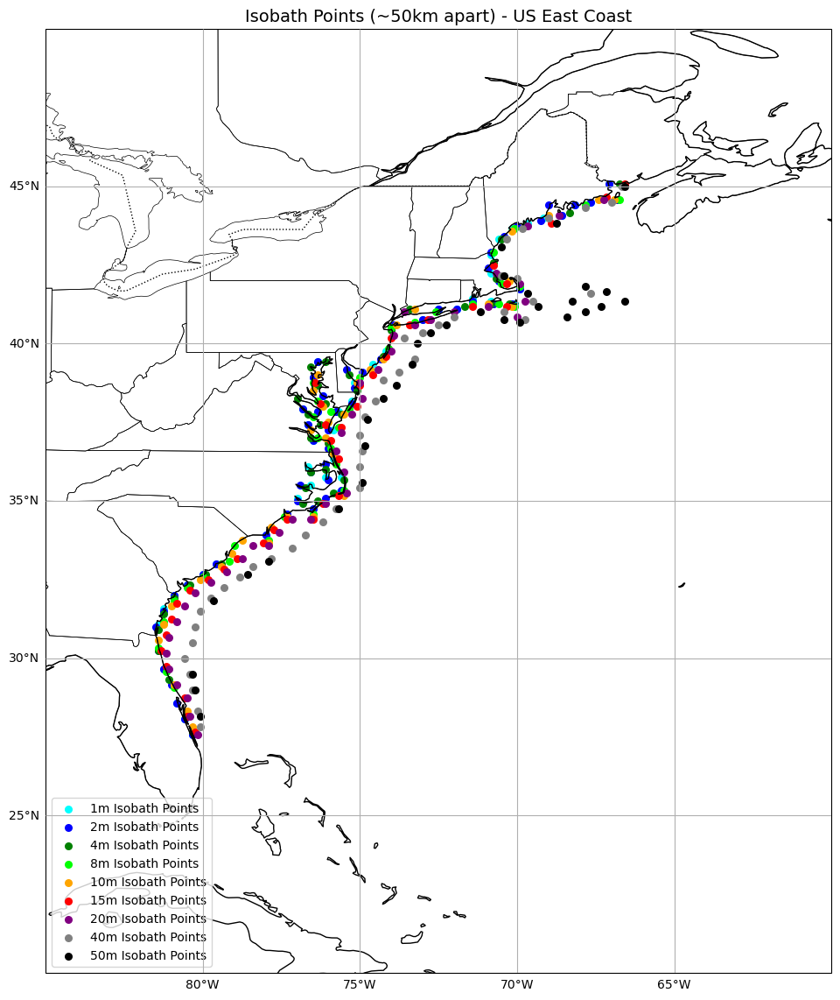

In [21]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# --- 4. Plot All Isobath Points ---
fig = plt.figure(figsize=(12, 14))
ax = plt.axes(projection=ccrs.PlateCarree())

# Map features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.STATES, linewidth=0.5)

ax.set_extent([
    275, 300,   # Longitude limits
    20, 50      # Latitude limits
], crs=ccrs.PlateCarree())

# Colormap for different isobaths
colors = {
    1: "cyan",
    2: "blue",
    4: "green",
    8: "lime",
    10: "orange",
    15: "red",
    20: "purple",
    50: "black"
}

# Plot each isobath points
for depth, df in isobath_dfs.items():
    ax.scatter(df["longitude"], df["latitude"],
               color=colors.get(depth, "gray"),
               s=30, label=f"{depth}m Isobath Points")

# Gridlines
gl = ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False, zorder=6)
gl.ylabels_left = True
gl.xlabels_bottom = True

# Plot arrows pointing North for all points
arrow_length = 1.0  # degrees (~100 km)

for df in isobath_dfs.values():
    for lat, lon in zip(df["latitude"], df["longitude"]):
        ax.arrow(lon, lat, 0, arrow_length,
                 width=0.02, head_width=0.15, head_length=0.2,
                 length_includes_head=True, color='red')

# Title and legend
ax.set_title("Isobath Points (~50km apart) - US East Coast", fontsize=14)
ax.legend(loc="lower left")

plt.show()


In [31]:
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"
    lat_LR = depth_maps[i_lr]["latitude"].values
    lon_LR = depth_maps[i_lr]["longitude"].values
    lat_HR = depth_maps[i_hr]["latitude"].values
    lon_HR = depth_maps[i_hr]["longitude"].values

    # Interpolate variables
    depth_LR, depth_LR_lat, depth_LR_lon = interpolate_nearest_with_coords(depth_maps[i_lr]["lev"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    depth_HR, depth_HR_lat, depth_HR_lon = interpolate_nearest_with_coords(depth_maps[i_lr]["lev"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)


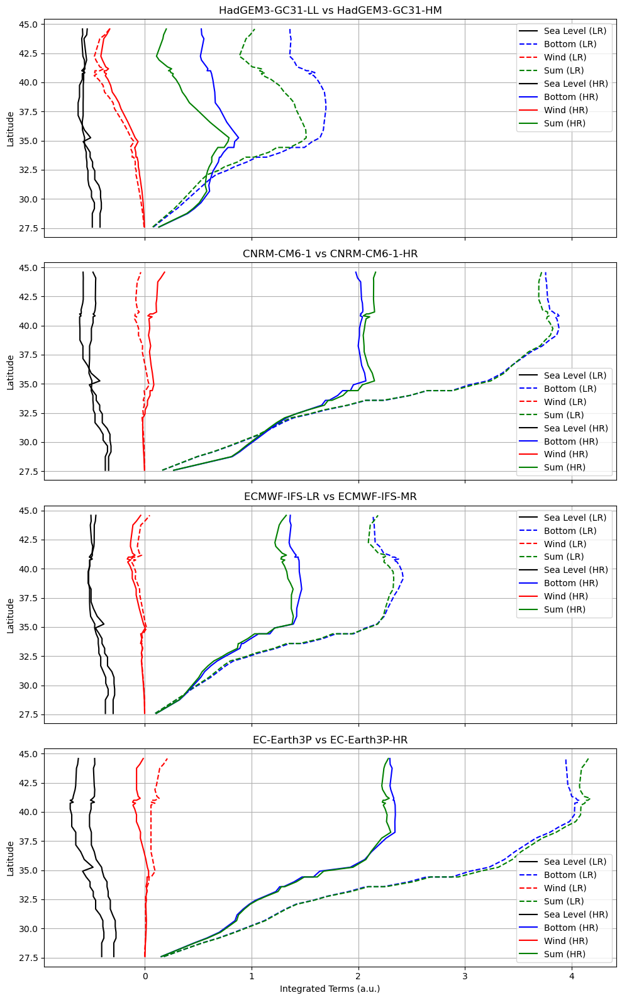

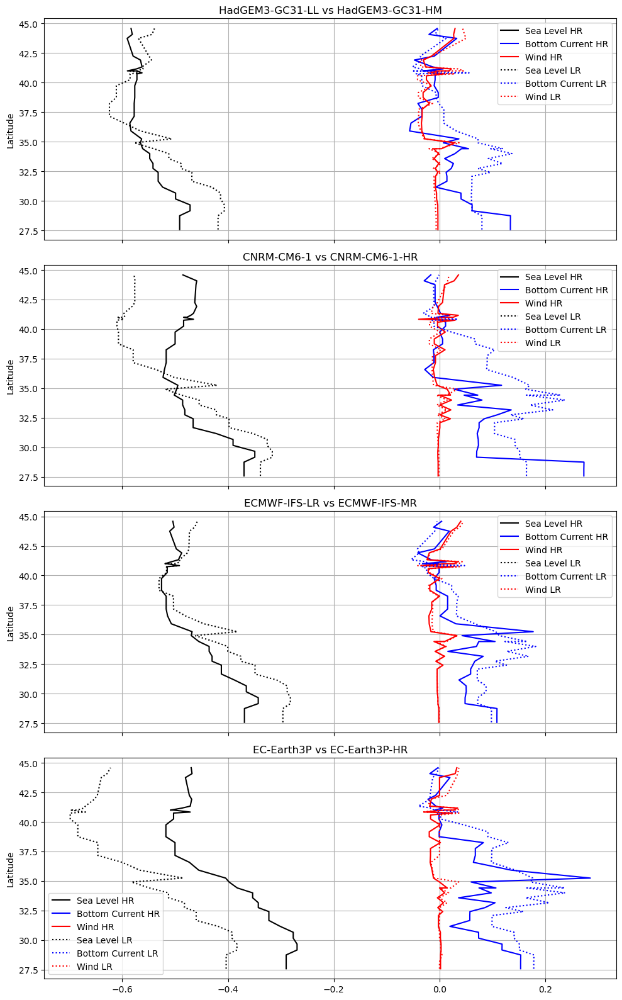

In [22]:
# Interpolates LR fields first, stores their interpolated coordinates (lat_LR_interp, lon_LR_interp), and then uses those same coordinates to interpolate HR fields.
# This gets the HR vaues nerest to LR

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# --- Helper functions ---
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

# --- Setup ---
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
bearings = [calculate_bearing(*iso_20_df.iloc[i][['latitude', 'longitude']],
                               *iso_20_df.iloc[i + 1][['latitude', 'longitude']])
            for i in range(len(iso_20_df) - 1)]
bearings.append(bearings[-1])
iso_20_df["bearing_to_next"] = bearings

sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# --- Plotting ---
fig1, axs1 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)
fig2, axs2 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)

for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values


    # Step 1: LR interpolations
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, vo_LR_lat, vo_LR_lon = interpolate_nearest_with_coords(ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, tauvo_LR_lat, tauvo_LR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_LR, zos_LR_lat, zos_LR_lon = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)

    #lat_LR_interp = interpolate_nearest(ds_models_uo[i_lr]["latitude"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    #lon_LR_interp = interpolate_nearest(ds_models_uo[i_lr]["longitude"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    lat_LR_interp = uo_LR_lat
    lon_LR_interp = uo_LR_lon


    # Step 2: HR interpolations using LR coordinates
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, lat_LR_interp, lon_LR_interp)
    vo_HR, vo_HR_lat, vo_HR_lon = interpolate_nearest_with_coords(ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, lat_LR_interp, lon_LR_interp)
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, lat_LR_interp, lon_LR_interp)
    tauvo_HR, tauvo_HR_lat, tauvo_HR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, lat_LR_interp, lon_LR_interp)
    zos_HR, zos_HR_lat, zos_HR_lon = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, lat_LR_interp, lon_LR_interp)

    # Compute bearing between adjacent interpolated LR points
    bearings_interp = []
    for i in range(len(uo_LR_lat) - 1):
        lat1, lon1 = uo_LR_lat[i], uo_LR_lon[i]
        lat2, lon2 = uo_LR_lat[i + 1], uo_LR_lon[i + 1]
        bearings_interp.append(calculate_bearing(lat1, lon1, lat2, lon2))
    bearings_interp.append(bearings_interp[-1])  # repeat last to match length

    bc_LR = project_to_bearing(uo_LR, vo_LR, bearings_interp)
    bc_HR = project_to_bearing(uo_HR, vo_HR, bearings_interp)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, bearings_interp)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, bearings_interp)

    # Step 3: Interpolate DTU mean sea level onto LR-interpolated locations
    #lat2d_dtu, lon2d_dtu = np.meshgrid(dtu_zos["latitude"].values, dtu_zos["longitude"].values, indexing="ij")

    #dtu_vals, _, _ = interpolate_nearest_with_coords(
    ##    dtu_zos["zos"], lat2d_dtu, lon2d_dtu,
    #    lat_LR_interp, lon_LR_interp
    #)
    
    #dtu_sorted = dtu_vals[sorter]

    
    # Project
    #bc_LR = project_to_bearing(uo_LR, vo_LR, iso_20_df["bearing_to_next"].values)
    #bc_HR = project_to_bearing(uo_HR, vo_HR, iso_20_df["bearing_to_next"].values)
    #ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, iso_20_df["bearing_to_next"].values)
    #ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, iso_20_df["bearing_to_next"].values)

    # Integrate
    bc_cumsum_LR = np.cumsum(bc_LR[sorter])
    bc_cumsum_HR = np.cumsum(bc_HR[sorter])
    ws_cumsum_LR = np.cumsum(ws_LR[sorter])
    ws_cumsum_HR = np.cumsum(ws_HR[sorter])
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]
    sum_LR = bc_cumsum_LR + ws_cumsum_LR
    sum_HR = bc_cumsum_HR + ws_cumsum_HR

    # Plot cumulative
    ax = axs1[n]
    ax.plot(zos_sorted_LR, lat_sorted, label="Sea Level (LR)", color="black")
    ax.plot(bc_cumsum_LR, lat_sorted, label="Bottom (LR)", color="blue", linestyle="--")
    ax.plot(ws_cumsum_LR, lat_sorted, label="Wind (LR)", color="red", linestyle="--")
    ax.plot(sum_LR, lat_sorted, label="Sum (LR)", color="green", linestyle="--")
    ax.plot(zos_sorted_HR, lat_sorted, label="Sea Level (HR)", color="black", linestyle="-")
    ax.plot(bc_cumsum_HR, lat_sorted, label="Bottom (HR)", color="blue")
    ax.plot(ws_cumsum_HR, lat_sorted, label="Wind (HR)", color="red")
    ax.plot(sum_HR, lat_sorted, label="Sum (HR)", color="green")
    ax.set_ylabel("Latitude")
    ax.set_title(label)
    ax.grid(True)
    ax.legend()

    # Plot raw projections
    ax2 = axs2[n]
    #ax2.plot(dtu_vals, iso_20_df["latitude"], label="DTU ZOS", color="purple", linestyle="-.")
    ax2.plot(zos_HR, iso_20_df["latitude"], label="Sea Level HR", color="black")
    ax2.plot(bc_HR, iso_20_df["latitude"], label="Bottom Current HR", color="blue", linestyle="-")
    ax2.plot(ws_HR, iso_20_df["latitude"], label="Wind HR", color="red", linestyle="-")
    ax2.plot(zos_LR, iso_20_df["latitude"], label="Sea Level LR", color="black", linestyle=":")
    ax2.plot(bc_LR, iso_20_df["latitude"], label="Bottom Current LR", color="blue", linestyle=":")
    ax2.plot(ws_LR, iso_20_df["latitude"], label="Wind LR", color="red", linestyle=":")
    ax2.set_ylabel("Latitude")
    ax2.set_title(label)
    ax2.grid(True)
    ax2.legend()

axs1[-1].set_xlabel("Integrated Terms (a.u.)")
fig1.tight_layout()
fig2.tight_layout()
plt.show()


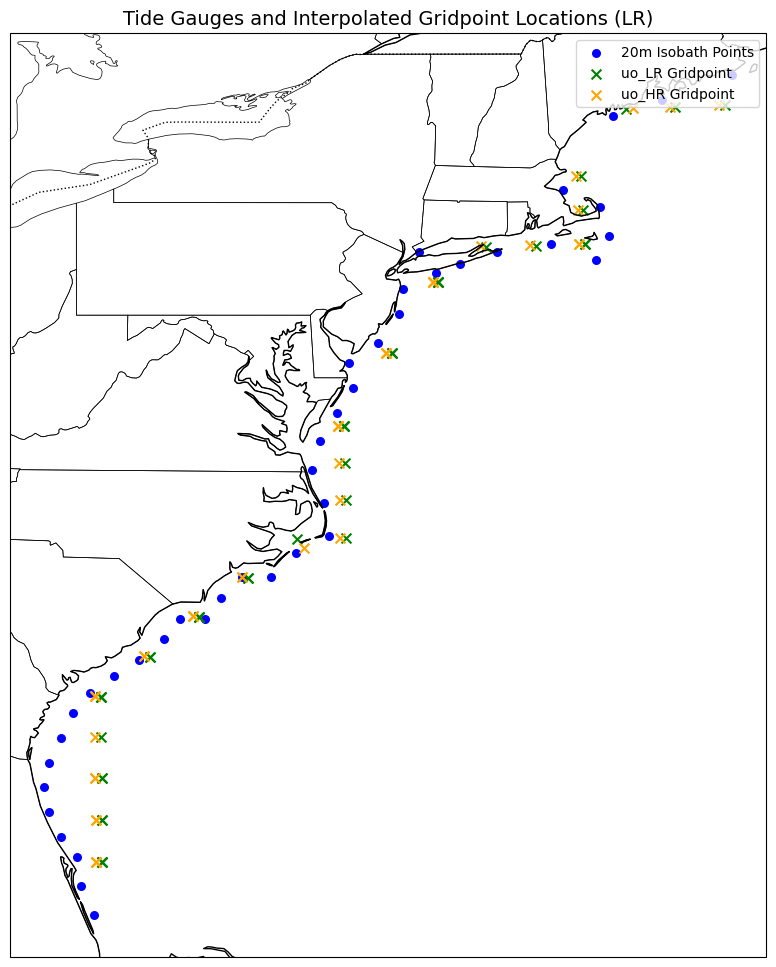

In [23]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Set up the map
fig = plt.figure(figsize=(10, 12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add base features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.STATES, linewidth=0.5)
#ax.set_extent([tg_sorted["lon"].min() - 2, tg_sorted["lon"].max() + 2,
#               tg_sorted["lat"].min() - 2, tg_sorted["lat"].max() + 2])

# Plot tide gauge locations
ax.scatter(iso_20_df["longitude"], iso_20_df["latitude"], color='blue', s=30, label="20m Isobath Points")

# Plot interpolated gridpoints (LR)
ax.scatter(zos_LR_lon, zos_LR_lat,
           color='green', marker='x', s=50, label="uo_LR Gridpoint")
ax.scatter(zos_HR_lon, zos_HR_lat,
           color='orange', marker='x', s=50, label="uo_HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_LR"], tg_sorted["interp_lat_tauuo_LR"],
 #          color='#fa9fb5', marker='x', s=50, label="tauuo_LR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_HR"], tg_sorted["interp_lat_tauuo_HR"],
 #          color='#c51b8a', marker='x', s=50, label="tauuo_HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_zos_LR"], tg_sorted["interp_lat_zos_LR"],
#           color='#9ecae1', marker='x', s=50, label="zos_LR Gridpoint"),
#ax.scatter(tg_sorted["interp_lon_zos_HR"], tg_sorted["interp_lat_zos_HR"],
#           color='#3182bd', marker='x', s=50, label="zos_HR Gridpoint")

# Add bearing arrows between tide gauge pairs
#for i in range(len(tg_sorted) - 1):
#    lat = tg_sorted.loc[i, "lat"]
#    lon = tg_sorted.loc[i, "lon"]
#    bearing = tg_sorted.loc[i, "bearing_to_next"]
    
#    if np.isnan(bearing):
#        continue

 #   arrow_length = 3.0  # degrees
 #   angle_rad = np.radians(bearing)
 #   dx = arrow_length * np.sin(angle_rad)
 #   dy = arrow_length * np.cos(angle_rad)

    #ax.arrow(lon, lat, dx, dy,
    #         width=0.05, head_width=0.3, head_length=0.3,
    #         length_includes_head=True, color='red')

# Add tide gauge labels
#for i, row in tg_sorted.iterrows():
#    ax.text(row["lon"] + 0.1, row["lat"] + 0.1, str(row["name"]), fontsize=9)

# Title and legend
ax.set_title("Tide Gauges and Interpolated Gridpoint Locations (LR)", fontsize=14)
ax.legend(loc='upper right')
plt.show()


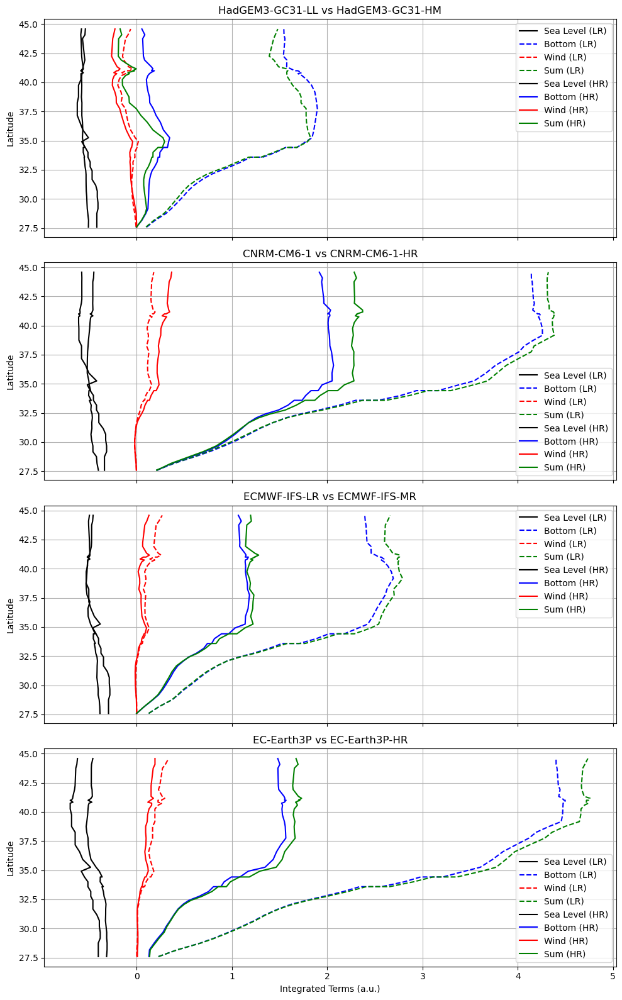

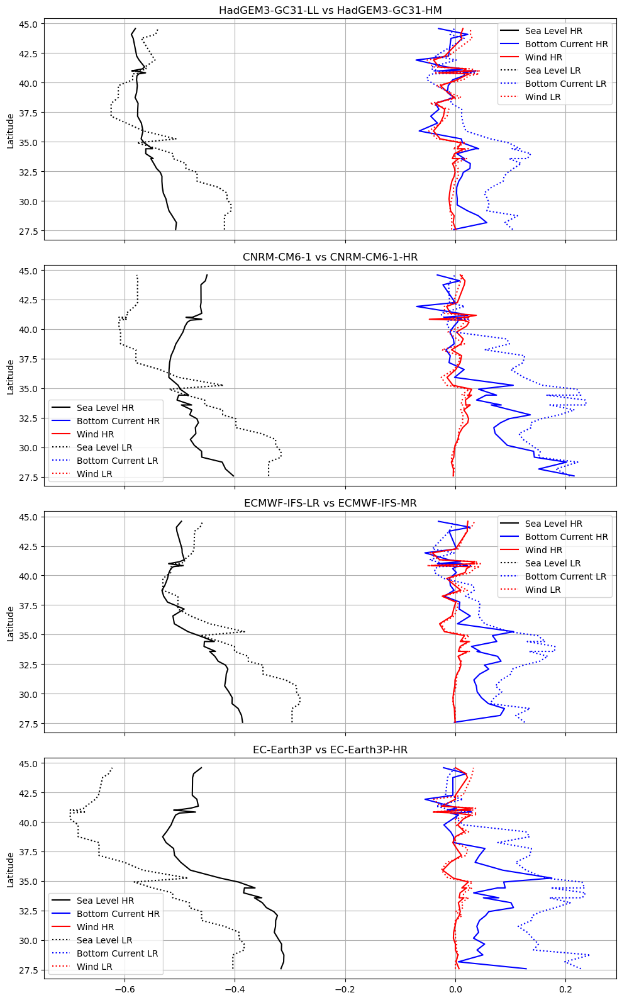

In [24]:
#Interpolates both LR and HR data directly to the isobath coordinates (iso_20_df["latitude"], lons_360).

#Uses the same bearing values (iso_20_df["bearing_to_next"]) for projecting LR and HR vectors.

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# -- Helper functions (unchanged) --
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

# -- Prepare bearings for 20m isobath --
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)

bearings = [calculate_bearing(*iso_20_df.iloc[i][['latitude', 'longitude']],
                               *iso_20_df.iloc[i + 1][['latitude', 'longitude']])
            for i in range(len(iso_20_df) - 1)]
bearings.append(bearings[-1])
iso_20_df["bearing_to_next"] = bearings

# -- Sort for cumulative integration --
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# -- Loop over 4 model pairs --
fig1, axs1 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)
fig2, axs2 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)

for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Grid
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate variables
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, vo_LR_lat, vo_LR_lon = interpolate_nearest_with_coords(ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    vo_HR, vo_HR_lat, vo_HR_lon = interpolate_nearest_with_coords(ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, tauvo_LR_lat, tauvo_LR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    tauvo_HR, tauvo_HR_lat, tauvo_HR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    zos_LR, zos_LR_lat, zos_LR_lon = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_HR, zos_HR_lat, zos_HR_lon = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Project
    bc_LR = project_to_bearing(uo_LR, vo_LR, iso_20_df["bearing_to_next"].values)
    bc_HR = project_to_bearing(uo_HR, vo_HR, iso_20_df["bearing_to_next"].values)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, iso_20_df["bearing_to_next"].values)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, iso_20_df["bearing_to_next"].values)

    # Integrate
    bc_cumsum_LR = np.cumsum(bc_LR[sorter])
    bc_cumsum_HR = np.cumsum(bc_HR[sorter])
    ws_cumsum_LR = np.cumsum(ws_LR[sorter])
    ws_cumsum_HR = np.cumsum(ws_HR[sorter])
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]

    sum_LR = bc_cumsum_LR + ws_cumsum_LR
    sum_HR = bc_cumsum_HR + ws_cumsum_HR

    # -- Plot cumulative integrals --
    ax = axs1[n]
    ax.plot(zos_sorted_LR, lat_sorted, label="Sea Level (LR)", color="black")
    ax.plot(bc_cumsum_LR, lat_sorted, label="Bottom (LR)", color="blue", linestyle="--")
    ax.plot(ws_cumsum_LR, lat_sorted, label="Wind (LR)", color="red", linestyle="--")
    ax.plot(sum_LR, lat_sorted, label="Sum (LR)", color="green", linestyle="--")

    ax.plot(zos_sorted_HR, lat_sorted, label="Sea Level (HR)", color="black", linestyle="-")
    ax.plot(bc_cumsum_HR, lat_sorted, label="Bottom (HR)", color="blue")
    ax.plot(ws_cumsum_HR, lat_sorted, label="Wind (HR)", color="red")
    ax.plot(sum_HR, lat_sorted, label="Sum (HR)", color="green")

    ax.set_ylabel("Latitude")
    ax.set_title(label)
    ax.grid(True)
    ax.legend()

    # -- Plot raw projections --
    ax2 = axs2[n]
    ax2.plot(zos_HR, iso_20_df["latitude"], label="Sea Level HR", color="black")
    ax2.plot(bc_HR, iso_20_df["latitude"], label="Bottom Current HR", color="blue", linestyle="-")
    ax2.plot(ws_HR, iso_20_df["latitude"], label="Wind HR", color="red", linestyle="-")

    ax2.plot(zos_LR, iso_20_df["latitude"], label="Sea Level LR", color="black", linestyle=":")
    ax2.plot(bc_LR, iso_20_df["latitude"], label="Bottom Current LR", color="blue", linestyle=":")
    ax2.plot(ws_LR, iso_20_df["latitude"], label="Wind LR", color="red", linestyle=":")

    ax2.set_ylabel("Latitude")
    ax2.set_title(label)
    ax2.grid(True)
    ax2.legend()

axs1[-1].set_xlabel("Integrated Terms (a.u.)")
#axs2[-1].set_xlabel("Projected Terms (a.u.)")
fig1.tight_layout()
fig2.tight_layout()
plt.show()


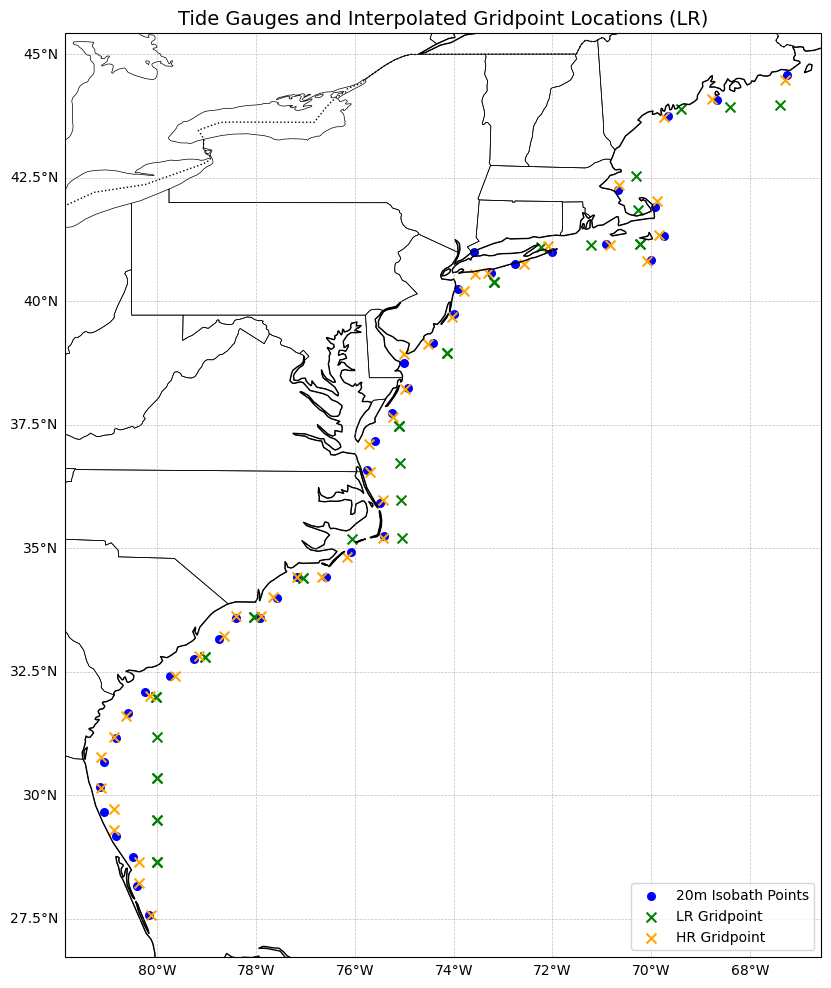

In [25]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Set up the map
fig = plt.figure(figsize=(10, 12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add base features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.STATES, linewidth=0.5)
#ax.set_extent([tg_sorted["lon"].min() - 2, tg_sorted["lon"].max() + 2,
#               tg_sorted["lat"].min() - 2, tg_sorted["lat"].max() + 2])

# Add gridlines with latitude and longitude labels
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

# Plot tide gauge locations
ax.scatter(iso_20_df["longitude"], iso_20_df["latitude"], color='blue', s=30, label="20m Isobath Points")

# Plot interpolated gridpoints (LR)
ax.scatter(zos_LR_lon, zos_LR_lat,
           color='green', marker='x', s=50, label="LR Gridpoint")
ax.scatter(zos_HR_lon, zos_HR_lat,
           color='orange', marker='x', s=50, label="HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_LR"], tg_sorted["interp_lat_tauuo_LR"],
 #          color='#fa9fb5', marker='x', s=50, label="tauuo_LR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_HR"], tg_sorted["interp_lat_tauuo_HR"],
 #          color='#c51b8a', marker='x', s=50, label="tauuo_HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_zos_LR"], tg_sorted["interp_lat_zos_LR"],
#           color='#9ecae1', marker='x', s=50, label="zos_LR Gridpoint"),
#ax.scatter(tg_sorted["interp_lon_zos_HR"], tg_sorted["interp_lat_zos_HR"],
#           color='#3182bd', marker='x', s=50, label="zos_HR Gridpoint")

# Add bearing arrows between tide gauge pairs
#for i in range(len(tg_sorted) - 1):
#    lat = tg_sorted.loc[i, "lat"]
#    lon = tg_sorted.loc[i, "lon"]
#    bearing = tg_sorted.loc[i, "bearing_to_next"]
    
#    if np.isnan(bearing):
#        continue

 #   arrow_length = 3.0  # degrees
 #   angle_rad = np.radians(bearing)
 #   dx = arrow_length * np.sin(angle_rad)
 #   dy = arrow_length * np.cos(angle_rad)

    #ax.arrow(lon, lat, dx, dy,
    #         width=0.05, head_width=0.3, head_length=0.3,
    #         length_includes_head=True, color='red')

# Add tide gauge labels
#for i, row in tg_sorted.iterrows():
#    ax.text(row["lon"] + 0.1, row["lat"] + 0.1, str(row["name"]), fontsize=9)

# Title and legend
ax.set_title("Tide Gauges and Interpolated Gridpoint Locations (LR)", fontsize=14)
ax.legend(loc='lower right')
plt.show()


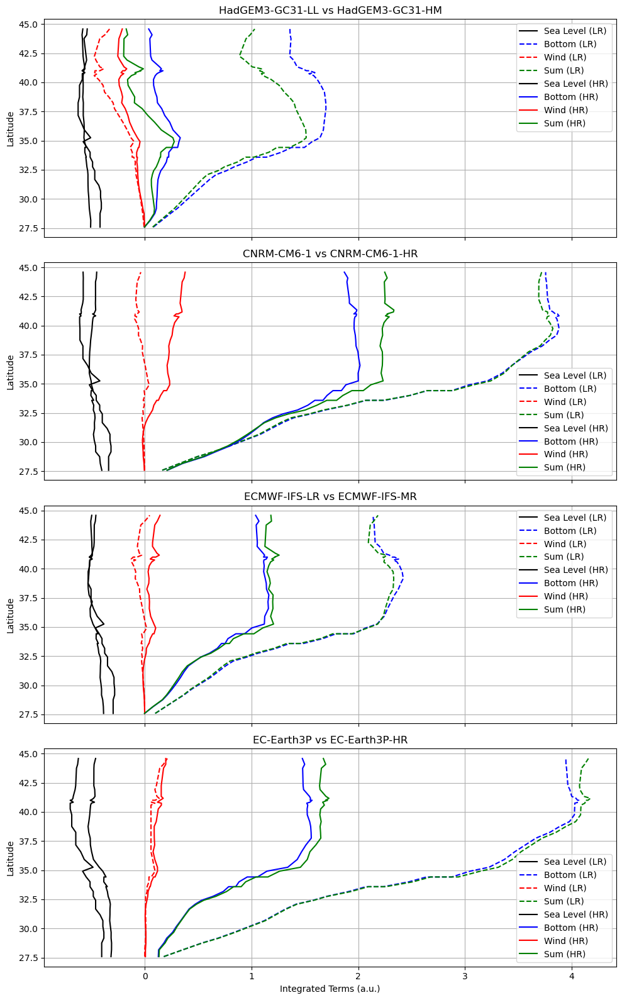

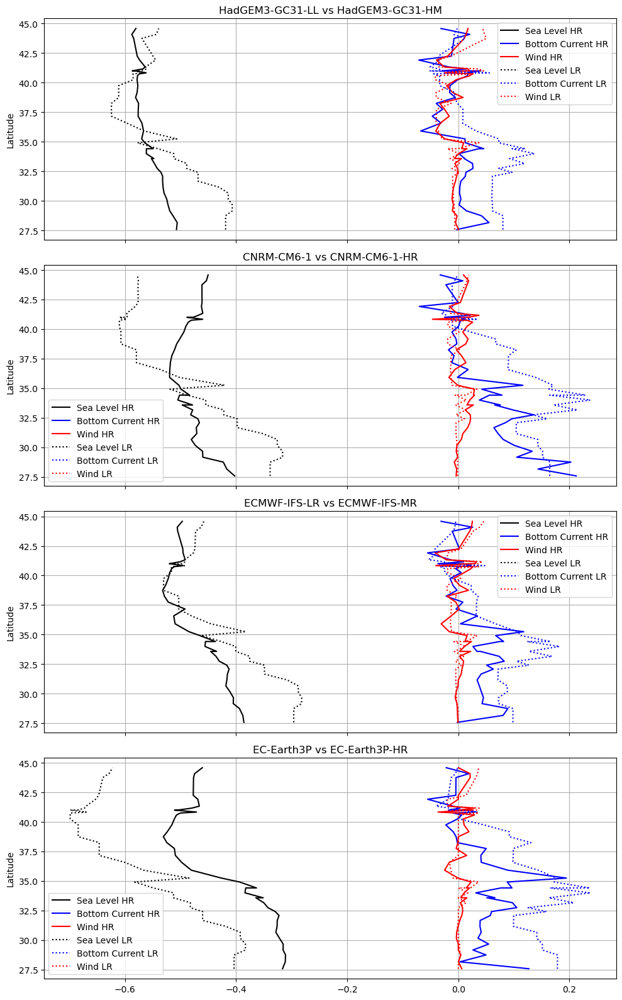

In [26]:
## Recalculates bearings independently for interpolated LR and HR locations (bearings_LR, bearings_HR), instead of using the fixed isobath bearings.


import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# -- Helper functions (unchanged) --
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

# -- Prepare bearings for 20m isobath --
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)

bearings = [calculate_bearing(*iso_20_df.iloc[i][['latitude', 'longitude']],
                               *iso_20_df.iloc[i + 1][['latitude', 'longitude']])
            for i in range(len(iso_20_df) - 1)]
bearings.append(bearings[-1])
iso_20_df["bearing_to_next"] = bearings

# -- Sort for cumulative integration --
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# -- Loop over 4 model pairs --
fig1, axs1 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)
fig2, axs2 = plt.subplots(4, 1, figsize=(10, 16), sharex=True)

for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Grid
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate variables
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, vo_LR_lat, vo_LR_lon = interpolate_nearest_with_coords(ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    vo_HR, vo_HR_lat, vo_HR_lon = interpolate_nearest_with_coords(ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, tauvo_LR_lat, tauvo_LR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = interpolate_nearest_with_coords(ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    tauvo_HR, tauvo_HR_lat, tauvo_HR_lon = interpolate_nearest_with_coords(ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    zos_LR, zos_LR_lat, zos_LR_lon = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_HR, zos_HR_lat, zos_HR_lon = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    bearings_LR = []
    for i in range(len(uo_LR_lat) - 1):
        lat1, lon1 = uo_LR_lat[i], uo_LR_lon[i]
        lat2, lon2 = uo_LR_lat[i + 1], uo_LR_lon[i + 1]
        bearings_LR.append(calculate_bearing(lat1, lon1, lat2, lon2))
    bearings_LR.append(bearings_LR[-1])  # repeat last to match length

    bearings_HR = []
    for i in range(len(uo_HR_lat) - 1):
        lat1, lon1 = uo_HR_lat[i], uo_HR_lon[i]
        lat2, lon2 = uo_HR_lat[i + 1], uo_HR_lon[i + 1]
        bearings_HR.append(calculate_bearing(lat1, lon1, lat2, lon2))
    bearings_HR.append(bearings_HR[-1])

   
    bc_LR = project_to_bearing(uo_LR, vo_LR, bearings_LR)
    bc_HR = project_to_bearing(uo_HR, vo_HR, bearings_HR)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, bearings_LR)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, bearings_HR)



    
    
    # Project
    #bc_LR = project_to_bearing(uo_LR, vo_LR, iso_20_df["bearing_to_next"].values)
    #bc_HR = project_to_bearing(uo_HR, vo_HR, iso_20_df["bearing_to_next"].values)
    #ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, iso_20_df["bearing_to_next"].values)
    #ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, iso_20_df["bearing_to_next"].values)

    # Integrate
    bc_cumsum_LR = np.cumsum(bc_LR[sorter])
    bc_cumsum_HR = np.cumsum(bc_HR[sorter])
    ws_cumsum_LR = np.cumsum(ws_LR[sorter])
    ws_cumsum_HR = np.cumsum(ws_HR[sorter])
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]

    sum_LR = bc_cumsum_LR + ws_cumsum_LR
    sum_HR = bc_cumsum_HR + ws_cumsum_HR

    # -- Plot cumulative integrals --
    ax = axs1[n]
    ax.plot(zos_sorted_LR, lat_sorted, label="Sea Level (LR)", color="black")
    ax.plot(bc_cumsum_LR, lat_sorted, label="Bottom (LR)", color="blue", linestyle="--")
    ax.plot(ws_cumsum_LR, lat_sorted, label="Wind (LR)", color="red", linestyle="--")
    ax.plot(sum_LR, lat_sorted, label="Sum (LR)", color="green", linestyle="--")

    ax.plot(zos_sorted_HR, lat_sorted, label="Sea Level (HR)", color="black", linestyle="-")
    ax.plot(bc_cumsum_HR, lat_sorted, label="Bottom (HR)", color="blue")
    ax.plot(ws_cumsum_HR, lat_sorted, label="Wind (HR)", color="red")
    ax.plot(sum_HR, lat_sorted, label="Sum (HR)", color="green")

    ax.set_ylabel("Latitude")
    ax.set_title(label)
    ax.grid(True)
    ax.legend()

    # -- Plot raw projections --
    ax2 = axs2[n]
    ax2.plot(zos_HR, iso_20_df["latitude"], label="Sea Level HR", color="black")
    ax2.plot(bc_HR, iso_20_df["latitude"], label="Bottom Current HR", color="blue", linestyle="-")
    ax2.plot(ws_HR, iso_20_df["latitude"], label="Wind HR", color="red", linestyle="-")

    ax2.plot(zos_LR, iso_20_df["latitude"], label="Sea Level LR", color="black", linestyle=":")
    ax2.plot(bc_LR, iso_20_df["latitude"], label="Bottom Current LR", color="blue", linestyle=":")
    ax2.plot(ws_LR, iso_20_df["latitude"], label="Wind LR", color="red", linestyle=":")

    ax2.set_ylabel("Latitude")
    ax2.set_title(label)
    ax2.grid(True)
    ax2.legend()

axs1[-1].set_xlabel("Integrated Terms (a.u.)")
#axs2[-1].set_xlabel("Projected Terms (a.u.)")
fig1.tight_layout()
fig2.tight_layout()
plt.show()


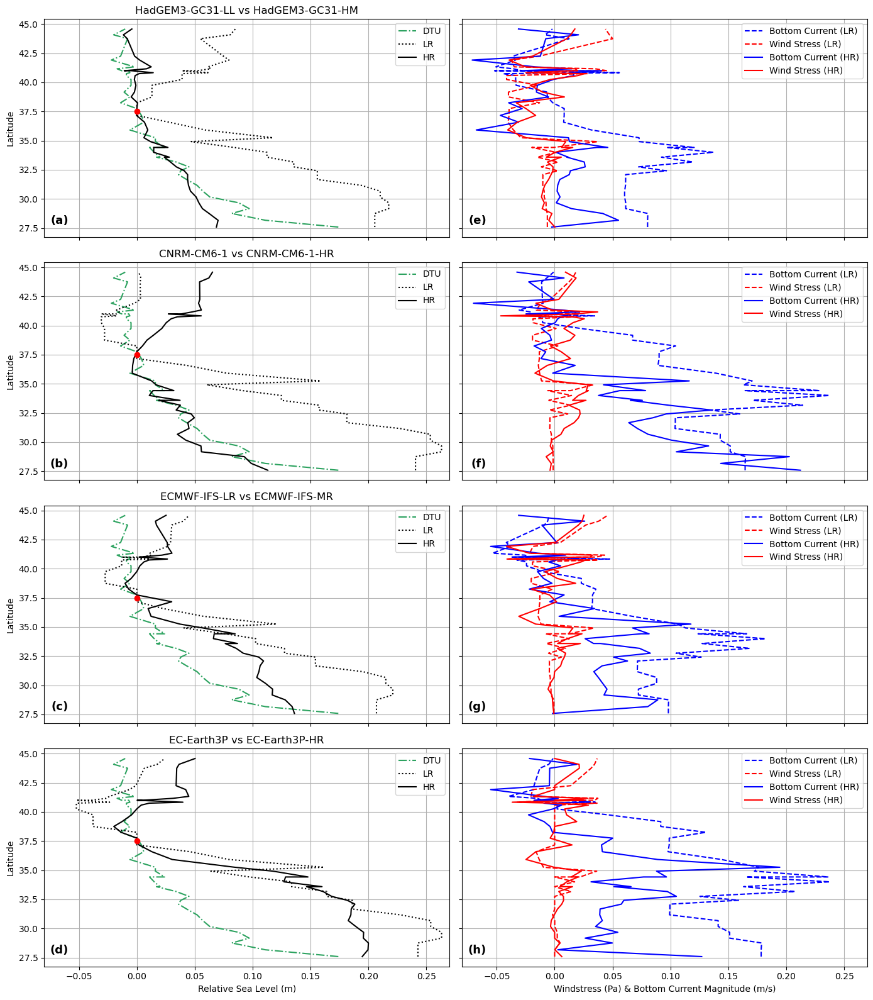

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# -- Helper functions --
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

# -- Prepare isobath and bearing info --
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# Interpolate DTU ZOS onto isobath
lat2d_dtu, lon2d_dtu = np.meshgrid(dtu_zos["latitude"].values, dtu_zos["longitude"].values, indexing="ij")
dtu_interp = interpolate_nearest(
    dtu_zos["zos"],
    lat2d_dtu, lon2d_dtu,
    iso_20_df["latitude"].values, lons_360
)
dtu_interp_sorted = dtu_interp[sorter]

# Compute DTU relative to 37.5N
ref_idx_dtu = np.abs(lat_sorted - 37.5).argmin()
dtu_rel = dtu_interp_sorted - dtu_interp_sorted[ref_idx_dtu]


# -- Plotting setup --
fig, axs = plt.subplots(4, 2, figsize=(14, 16), sharex='row')


# Panel labels (a–h)
panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']


for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Load grids
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate variables
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, _, _ = interpolate_nearest_with_coords(ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    vo_HR, _, _ = interpolate_nearest_with_coords(ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    tauuo_LR, _, _ = interpolate_nearest_with_coords(ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, _, _ = interpolate_nearest_with_coords(ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauuo_HR, _, _ = interpolate_nearest_with_coords(ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    tauvo_HR, _, _ = interpolate_nearest_with_coords(ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    zos_LR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_HR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Compute local bearings from interpolated coords
    bearings_LR = [calculate_bearing(uo_LR_lat[i], uo_LR_lon[i], uo_LR_lat[i+1], uo_LR_lon[i+1]) for i in range(len(uo_LR_lat)-1)]
    bearings_LR.append(bearings_LR[-1])
    bearings_HR = [calculate_bearing(uo_HR_lat[i], uo_HR_lon[i], uo_HR_lat[i+1], uo_HR_lon[i+1]) for i in range(len(uo_HR_lat)-1)]
    bearings_HR.append(bearings_HR[-1])

    # Project to alongshore direction
    bc_LR = project_to_bearing(uo_LR, vo_LR, bearings_LR)
    bc_HR = project_to_bearing(uo_HR, vo_HR, bearings_HR)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, bearings_LR)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, bearings_HR)

    # Sort data
    bc_LR = bc_LR[sorter]
    bc_HR = bc_HR[sorter]
    ws_LR = ws_LR[sorter]
    ws_HR = ws_HR[sorter]
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]

    # Relative sea level
    ref_idx = np.abs(lat_sorted - 37.5).argmin()
    zos_rel_LR = zos_sorted_LR - zos_sorted_LR[ref_idx]
    zos_rel_HR = zos_sorted_HR - zos_sorted_HR[ref_idx]

    

    # -- Left: Relative Sea Level --
    ax1 = axs[n, 0]
    ax1.plot(dtu_rel, lat_sorted, label="DTU", color="#2ca25f", linestyle="-.")
    ax1.plot(zos_rel_LR, lat_sorted, label="LR", color="black", linestyle=":")
    ax1.plot(zos_rel_HR, lat_sorted, label="HR", color="black", linestyle="-")
    ax1.plot(0, 37.5, marker='o', color='red', markersize=6)
    ax1.set_ylabel("Latitude")
    ax1.set_title(f"{label}")
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    if n < 3:
        ax1.set_xticklabels([])
    ax1.grid(True)
    ax1.legend()
    ax1.text(0.06, .1, panel_labels[n], transform=ax1.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')




    # -- Right: Raw Projected Forcing Terms --
    ax2 = axs[n, 1]
    ax2.plot(bc_LR, lat_sorted, label="Bottom Current (LR)", color="blue", linestyle="--")
    ax2.plot(ws_LR, lat_sorted, label="Wind Stress (LR)", color="red", linestyle="--")
    ax2.plot(bc_HR, lat_sorted, label="Bottom Current (HR)", color="blue")
    ax2.plot(ws_HR, lat_sorted, label="Wind Stress (HR)", color="red")
    if n < 3:
        ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    #ax2.set_title(f"{label} — Alongshore Forcing")
    ax2.grid(True)
    ax2.legend()
    ax2.text(0.06, .1, panel_labels[n+4], transform=ax2.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')

# Shared X labels
axs[-1, 0].set_xlabel("Relative Sea Level (m)")
axs[-1, 1].set_xlabel("Windstress (Pa) & Bottom Current Magnitude (m/s)")

fig.tight_layout()
plt.show()


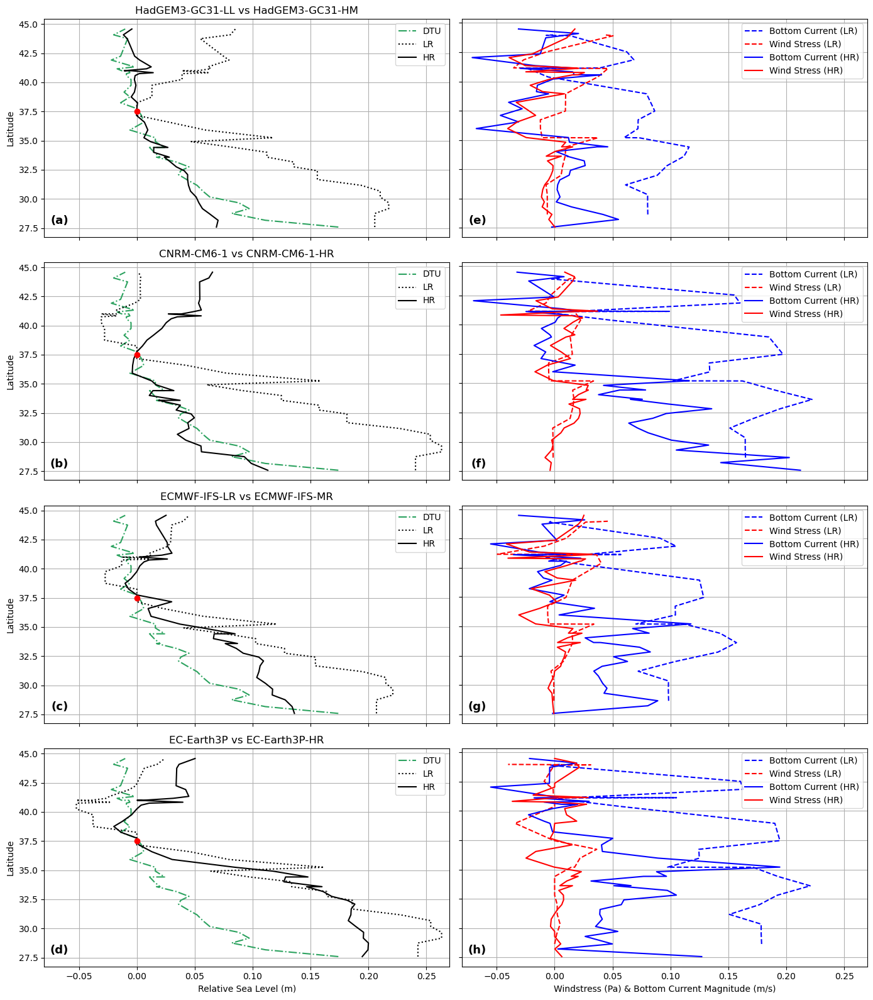

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# -- Helper functions --
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

def drop_duplicate_coords(values, lat, lon):
    coords = np.column_stack((lat, lon))
    _, unique_idx = np.unique(coords, axis=0, return_index=True)
    unique_idx = np.sort(unique_idx)  # preserve original order
    return values[unique_idx], lat[unique_idx], lon[unique_idx]


# -- Prepare isobath and bearing info --
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# Interpolate DTU ZOS onto isobath
lat2d_dtu, lon2d_dtu = np.meshgrid(dtu_zos["latitude"].values, dtu_zos["longitude"].values, indexing="ij")
dtu_interp = interpolate_nearest(
    dtu_zos["zos"],
    lat2d_dtu, lon2d_dtu,
    iso_20_df["latitude"].values, lons_360
)
dtu_interp_sorted = dtu_interp[sorter]

# Compute DTU relative to 37.5N
ref_idx_dtu = np.abs(lat_sorted - 37.5).argmin()
dtu_rel = dtu_interp_sorted - dtu_interp_sorted[ref_idx_dtu]


# -- Plotting setup --
fig, axs = plt.subplots(4, 2, figsize=(14, 16), sharex='row')


# Panel labels (a–h)
panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']


for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Load grids
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate variables
    # Interpolate LR u and v components
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(
        ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, _, _ = interpolate_nearest_with_coords(
        ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using uo_LR coordinates only
    uo_LR, uo_LR_lat, uo_LR_lon = drop_duplicate_coords(uo_LR, uo_LR_lat, uo_LR_lon)
    vo_LR = vo_LR[:len(uo_LR)]  # Ensure vo_LR matches filtered uo_LR

    # Interpolate HR u and v components
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(
        ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    vo_HR, _, _ = interpolate_nearest_with_coords(
        ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using uo_HR coordinates only
    uo_HR, uo_HR_lat, uo_HR_lon = drop_duplicate_coords(uo_HR, uo_HR_lat, uo_HR_lon)
    vo_HR = vo_HR[:len(uo_HR)]  # Ensure vo_HR matches filtered uo_HR

    # Interpolate LR wind stress components
    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = interpolate_nearest_with_coords(
        ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, _, _ = interpolate_nearest_with_coords(
        ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using tauuo_LR coordinates only
    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = drop_duplicate_coords(tauuo_LR, tauuo_LR_lat, tauuo_LR_lon)
    tauvo_LR = tauvo_LR[:len(tauuo_LR)]  # Ensure tauvo_LR matches filtered tauuo_LR

    # Interpolate HR wind stress components
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = interpolate_nearest_with_coords(
        ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    tauvo_HR, _, _ = interpolate_nearest_with_coords(
        ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using tauuo_HR coordinates only
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = drop_duplicate_coords(tauuo_HR, tauuo_HR_lat, tauuo_HR_lon)
    tauvo_HR = tauvo_HR[:len(tauuo_HR)]  # Ensure tauvo_HR matches filtered tauuo_HR

    zos_LR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_HR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Compute local bearings from interpolated coords
    bearings_LR = [calculate_bearing(uo_LR_lat[i], uo_LR_lon[i], uo_LR_lat[i+1], uo_LR_lon[i+1]) for i in range(len(uo_LR_lat)-1)]
    bearings_LR.append(bearings_LR[-1])
    bearings_HR = [calculate_bearing(uo_HR_lat[i], uo_HR_lon[i], uo_HR_lat[i+1], uo_HR_lon[i+1]) for i in range(len(uo_HR_lat)-1)]
    bearings_HR.append(bearings_HR[-1])


    # Compute local bearings from wind stress coords
    bearings_ws_LR = [calculate_bearing(tauuo_LR_lat[i], tauuo_LR_lon[i], tauuo_LR_lat[i+1], tauuo_LR_lon[i+1])
                      for i in range(len(tauuo_LR_lat) - 1)]
    bearings_ws_LR.append(bearings_ws_LR[-1])  # Match length
    bearings_ws_HR = [calculate_bearing(tauuo_HR_lat[i], tauuo_HR_lon[i], tauuo_HR_lat[i+1], tauuo_HR_lon[i+1])
                      for i in range(len(tauuo_HR_lat) - 1)]
    bearings_ws_HR.append(bearings_ws_HR[-1])


    # Project to alongshore direction
    bc_LR = project_to_bearing(uo_LR, vo_LR, bearings_LR)
    bc_HR = project_to_bearing(uo_HR, vo_HR, bearings_HR)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, bearings_ws_LR)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, bearings_ws_HR)


    # Sorter for LR
    sorter_LR = np.argsort(uo_LR_lat)
    lat_sorted_LR = uo_LR_lat[sorter_LR]

    # Sorter for HR
    sorter_HR = np.argsort(uo_HR_lat)
    lat_sorted_HR = uo_HR_lat[sorter_HR]

    # Sort LR data
    bc_LR = bc_LR[sorter_LR]
    ws_LR = ws_LR[sorter_LR]
    #zos_sorted_LR = zos_LR[sorter_LR]

    # Sort HR data
    bc_HR = bc_HR[sorter_HR]
    ws_HR = ws_HR[sorter_HR]
    #zos_sorted_HR = zos_HR[sorter_HR]


    # Sort data
    #bc_LR = bc_LR[sorter]
    #bc_HR = bc_HR[sorter]
    #ws_LR = ws_LR[sorter]
    #ws_HR = ws_HR[sorter]
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]

    # Relative sea level
    ref_idx = np.abs(lat_sorted - 37.5).argmin()
    zos_rel_LR = zos_sorted_LR - zos_sorted_LR[ref_idx]
    zos_rel_HR = zos_sorted_HR - zos_sorted_HR[ref_idx]

    

    # -- Left: Relative Sea Level --
    ax1 = axs[n, 0]
    ax1.plot(dtu_rel, lat_sorted, label="DTU", color="#2ca25f", linestyle="-.")
    ax1.plot(zos_rel_LR, lat_sorted, label="LR", color="black", linestyle=":")
    ax1.plot(zos_rel_HR, lat_sorted, label="HR", color="black", linestyle="-")
    ax1.plot(0, 37.5, marker='o', color='red', markersize=6)
    ax1.set_ylabel("Latitude")
    ax1.set_title(f"{label}")
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    if n < 3:
        ax1.set_xticklabels([])
    ax1.grid(True)
    ax1.legend()
    ax1.text(0.06, .1, panel_labels[n], transform=ax1.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')




    # -- Right: Raw Projected Forcing Terms --
    ax2 = axs[n, 1]
    ax2.plot(bc_LR, lat_sorted_LR, label="Bottom Current (LR)", color="blue", linestyle="--")
    ax2.plot(ws_LR, lat_sorted_LR, label="Wind Stress (LR)", color="red", linestyle="--")
    ax2.plot(bc_HR, lat_sorted_HR, label="Bottom Current (HR)", color="blue")
    ax2.plot(ws_HR, lat_sorted_HR, label="Wind Stress (HR)", color="red")
    if n < 3:
        ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    #ax2.set_title(f"{label} — Alongshore Forcing")
    ax2.grid(True)
    ax2.legend()
    ax2.text(0.06, .1, panel_labels[n+4], transform=ax2.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')

# Shared X labels
axs[-1, 0].set_xlabel("Relative Sea Level (m)")
axs[-1, 1].set_xlabel("Windstress (Pa) & Bottom Current Magnitude (m/s)")

fig.tight_layout()
plt.show()


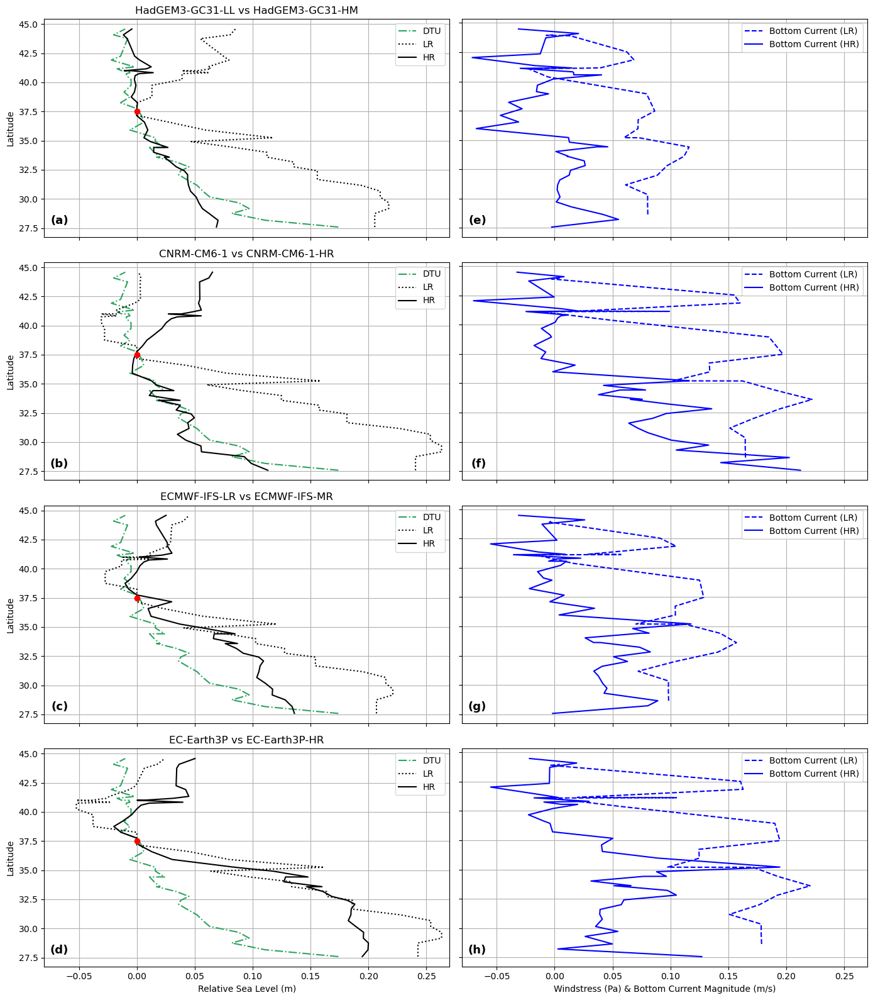

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# -- Helper functions --
def interpolate_nearest(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    return griddata(
        points=(lat_flat[mask], lon_flat[mask]),
        values=values_flat[mask],
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1)*np.sin(lat2) - np.sin(lat1)*np.cos(lat2)*np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def project_to_bearing(u, v, bearings_deg):
    theta = np.radians(bearings_deg)
    return u * np.sin(theta) + v * np.cos(theta)

def drop_duplicate_coords(values, lat, lon):
    coords = np.column_stack((lat, lon))
    _, unique_idx = np.unique(coords, axis=0, return_index=True)
    unique_idx = np.sort(unique_idx)  # preserve original order
    return values[unique_idx], lat[unique_idx], lon[unique_idx]


# -- Prepare isobath and bearing info --
iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

# Interpolate DTU ZOS onto isobath
lat2d_dtu, lon2d_dtu = np.meshgrid(dtu_zos["latitude"].values, dtu_zos["longitude"].values, indexing="ij")
dtu_interp = interpolate_nearest(
    dtu_zos["zos"],
    lat2d_dtu, lon2d_dtu,
    iso_20_df["latitude"].values, lons_360
)
dtu_interp_sorted = dtu_interp[sorter]

# Compute DTU relative to 37.5N
ref_idx_dtu = np.abs(lat_sorted - 37.5).argmin()
dtu_rel = dtu_interp_sorted - dtu_interp_sorted[ref_idx_dtu]


# -- Plotting setup --
fig, axs = plt.subplots(4, 2, figsize=(14, 16), sharex='row')


# Panel labels (a–h)
panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']


for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Load grids
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate variables
    # Interpolate LR u and v components
    uo_LR, uo_LR_lat, uo_LR_lon = interpolate_nearest_with_coords(
        ds_models_uo[i_lr]["bottom_uo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    vo_LR, _, _ = interpolate_nearest_with_coords(
        ds_models_vo[i_lr]["bottom_vo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using uo_LR coordinates only
    uo_LR, uo_LR_lat, uo_LR_lon = drop_duplicate_coords(uo_LR, uo_LR_lat, uo_LR_lon)
    vo_LR = vo_LR[:len(uo_LR)]  # Ensure vo_LR matches filtered uo_LR

    # Interpolate HR u and v components
    uo_HR, uo_HR_lat, uo_HR_lon = interpolate_nearest_with_coords(
        ds_models_uo[i_hr]["bottom_uo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    vo_HR, _, _ = interpolate_nearest_with_coords(
        ds_models_vo[i_hr]["bottom_vo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using uo_HR coordinates only
    uo_HR, uo_HR_lat, uo_HR_lon = drop_duplicate_coords(uo_HR, uo_HR_lat, uo_HR_lon)
    vo_HR = vo_HR[:len(uo_HR)]  # Ensure vo_HR matches filtered uo_HR

    # Interpolate LR wind stress components
    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = interpolate_nearest_with_coords(
        ds_models_tauu[i_lr]["tauuo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    tauvo_LR, _, _ = interpolate_nearest_with_coords(
        ds_models_tauv[i_lr]["tauvo"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using tauuo_LR coordinates only
    tauuo_LR, tauuo_LR_lat, tauuo_LR_lon = drop_duplicate_coords(tauuo_LR, tauuo_LR_lat, tauuo_LR_lon)
    tauvo_LR = tauvo_LR[:len(tauuo_LR)]  # Ensure tauvo_LR matches filtered tauuo_LR

    # Interpolate HR wind stress components
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = interpolate_nearest_with_coords(
        ds_models_tauu[i_hr]["tauuo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)
    tauvo_HR, _, _ = interpolate_nearest_with_coords(
        ds_models_tauv[i_hr]["tauvo"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Filter duplicates using tauuo_HR coordinates only
    tauuo_HR, tauuo_HR_lat, tauuo_HR_lon = drop_duplicate_coords(tauuo_HR, tauuo_HR_lat, tauuo_HR_lon)
    tauvo_HR = tauvo_HR[:len(tauuo_HR)]  # Ensure tauvo_HR matches filtered tauuo_HR

    zos_LR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_lr]["zos"], lat_LR, lon_LR, iso_20_df["latitude"], lons_360)
    zos_HR, _, _ = interpolate_nearest_with_coords(ds_models_zos[i_hr]["zos"], lat_HR, lon_HR, iso_20_df["latitude"], lons_360)

    # Compute local bearings from interpolated coords
    bearings_LR = [calculate_bearing(uo_LR_lat[i], uo_LR_lon[i], uo_LR_lat[i+1], uo_LR_lon[i+1]) for i in range(len(uo_LR_lat)-1)]
    bearings_LR.append(bearings_LR[-1])
    bearings_HR = [calculate_bearing(uo_HR_lat[i], uo_HR_lon[i], uo_HR_lat[i+1], uo_HR_lon[i+1]) for i in range(len(uo_HR_lat)-1)]
    bearings_HR.append(bearings_HR[-1])


    # Compute local bearings from wind stress coords
    bearings_ws_LR = [calculate_bearing(tauuo_LR_lat[i], tauuo_LR_lon[i], tauuo_LR_lat[i+1], tauuo_LR_lon[i+1])
                      for i in range(len(tauuo_LR_lat) - 1)]
    bearings_ws_LR.append(bearings_ws_LR[-1])  # Match length
    bearings_ws_HR = [calculate_bearing(tauuo_HR_lat[i], tauuo_HR_lon[i], tauuo_HR_lat[i+1], tauuo_HR_lon[i+1])
                      for i in range(len(tauuo_HR_lat) - 1)]
    bearings_ws_HR.append(bearings_ws_HR[-1])


    # Project to alongshore direction
    bc_LR = project_to_bearing(uo_LR, vo_LR, bearings_LR)
    bc_HR = project_to_bearing(uo_HR, vo_HR, bearings_HR)
    ws_LR = project_to_bearing(tauuo_LR, tauvo_LR, bearings_ws_LR)
    ws_HR = project_to_bearing(tauuo_HR, tauvo_HR, bearings_ws_HR)


    # Sorter for LR
    sorter_LR = np.argsort(uo_LR_lat)
    lat_sorted_LR = uo_LR_lat[sorter_LR]

    # Sorter for HR
    sorter_HR = np.argsort(uo_HR_lat)
    lat_sorted_HR = uo_HR_lat[sorter_HR]

    # Sort LR data
    bc_LR = bc_LR[sorter_LR]
    ws_LR = ws_LR[sorter_LR]
    #zos_sorted_LR = zos_LR[sorter_LR]

    # Sort HR data
    bc_HR = bc_HR[sorter_HR]
    ws_HR = ws_HR[sorter_HR]
    #zos_sorted_HR = zos_HR[sorter_HR]


    # Sort data
    #bc_LR = bc_LR[sorter]
    #bc_HR = bc_HR[sorter]
    #ws_LR = ws_LR[sorter]
    #ws_HR = ws_HR[sorter]
    zos_sorted_LR = zos_LR[sorter]
    zos_sorted_HR = zos_HR[sorter]

    # Relative sea level
    ref_idx = np.abs(lat_sorted - 37.5).argmin()
    zos_rel_LR = zos_sorted_LR - zos_sorted_LR[ref_idx]
    zos_rel_HR = zos_sorted_HR - zos_sorted_HR[ref_idx]

    

    # -- Left: Relative Sea Level --
    ax1 = axs[n, 0]
    ax1.plot(dtu_rel, lat_sorted, label="DTU", color="#2ca25f", linestyle="-.")
    ax1.plot(zos_rel_LR, lat_sorted, label="LR", color="black", linestyle=":")
    ax1.plot(zos_rel_HR, lat_sorted, label="HR", color="black", linestyle="-")
    ax1.plot(0, 37.5, marker='o', color='red', markersize=6)
    ax1.set_ylabel("Latitude")
    ax1.set_title(f"{label}")
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    if n < 3:
        ax1.set_xticklabels([])
    ax1.grid(True)
    ax1.legend()
    ax1.text(0.06, .1, panel_labels[n], transform=ax1.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')




    # -- Right: Raw Projected Forcing Terms --
    ax2 = axs[n, 1]
    ax2.plot(bc_LR, lat_sorted_LR, label="Bottom Current (LR)", color="blue", linestyle="--")
    #ax2.plot(ws_LR, lat_sorted_LR, label="Wind Stress (LR)", color="red", linestyle="--")
    ax2.plot(bc_HR, lat_sorted_HR, label="Bottom Current (HR)", color="blue")
    #ax2.plot(ws_HR, lat_sorted_HR, label="Wind Stress (HR)", color="red")
    if n < 3:
        ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    ax1.set_xlim(-0.08, 0.27)  # <-- Fixed x-axis range
    #ax2.set_title(f"{label} — Alongshore Forcing")
    ax2.grid(True)
    ax2.legend()
    ax2.text(0.06, .1, panel_labels[n+4], transform=ax2.transAxes,
         fontsize=13, fontweight='bold', va='top', ha='right')

# Shared X labels
axs[-1, 0].set_xlabel("Relative Sea Level (m)")
axs[-1, 1].set_xlabel("Windstress (Pa) & Bottom Current Magnitude (m/s)")

fig.tight_layout()
plt.show()


NameError: name 'zos_LR_lon' is not defined

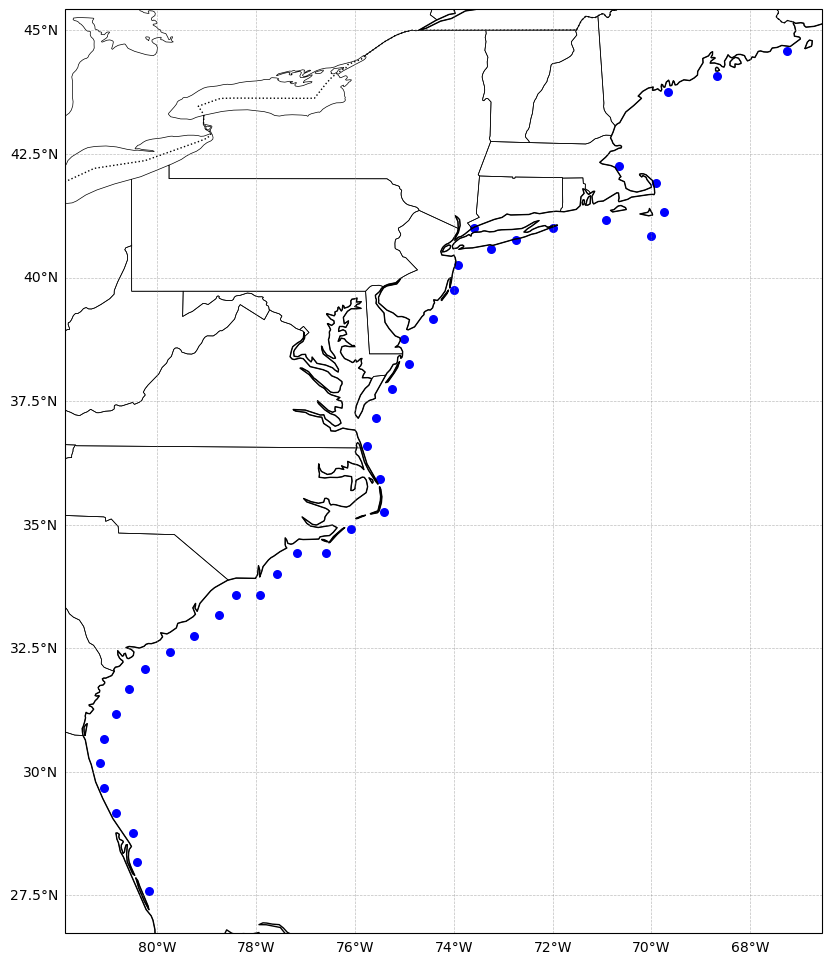

In [59]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Set up the map
fig = plt.figure(figsize=(10, 12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add base features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.STATES, linewidth=0.5)
#ax.set_extent([tg_sorted["lon"].min() - 2, tg_sorted["lon"].max() + 2,
#               tg_sorted["lat"].min() - 2, tg_sorted["lat"].max() + 2])

# Add gridlines with latitude and longitude labels
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

# Plot tide gauge locations
ax.scatter(iso_20_df["longitude"], iso_20_df["latitude"], color='blue', s=30, label="20m Isobath Points")

# Plot interpolated gridpoints (LR)
ax.scatter(zos_LR_lon, zos_LR_lat,
           color='green', marker='x', s=50, label="LR Gridpoint")
ax.scatter(zos_HR_lon, zos_HR_lat,
           color='orange', marker='x', s=50, label="HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_LR"], tg_sorted["interp_lat_tauuo_LR"],
#          color='#fa9fb5', marker='x', s=50, label="tauuo_LR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_tauuo_HR"], tg_sorted["interp_lat_tauuo_HR"],
#          color='#c51b8a', marker='x', s=50, label="tauuo_HR Gridpoint")
#ax.scatter(tg_sorted["interp_lon_zos_LR"], tg_sorted["interp_lat_zos_LR"],
#           color='#9ecae1', marker='x', s=50, label="zos_LR Gridpoint"),
#ax.scatter(tg_sorted["interp_lon_zos_HR"], tg_sorted["interp_lat_zos_HR"],
#           color='#3182bd', marker='x', s=50, label="zos_HR Gridpoint")

# Add bearing arrows between tide gauge pairs
#for i in range(len(tg_sorted) - 1):
#    lat = tg_sorted.loc[i, "lat"]
#    lon = tg_sorted.loc[i, "lon"]
#    bearing = tg_sorted.loc[i, "bearing_to_next"]
    
#    if np.isnan(bearing):
#        continue

 #   arrow_length = 3.0  # degrees
 #   angle_rad = np.radians(bearing)
 #   dx = arrow_length * np.sin(angle_rad)
 #   dy = arrow_length * np.cos(angle_rad)

    #ax.arrow(lon, lat, dx, dy,
    #         width=0.05, head_width=0.3, head_length=0.3,
    #         length_includes_head=True, color='red')

# Add tide gauge labels
#for i, row in tg_sorted.iterrows():
#    ax.text(row["lon"] + 0.1, row["lat"] + 0.1, str(row["name"]), fontsize=9)

# Title and legend
ax.set_title("Tide Gauges and Interpolated Gridpoint Locations (LR)", fontsize=14)
ax.legend(loc='lower right')
plt.show()


In [ ]:
# ---- 4-panel along-coast bathymetry plot (LR vs HR) ----
fig, axs = plt.subplots(4, 1, figsize=(10, 12), sharex=True)

panel_labels = ['(a)', '(b)', '(c)', '(d)']

for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    ax = axs[n]
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # Interpolate LR bathymetry
    lat_LR = depth_maps[i_lr]["latitude"].values
    lon_LR = depth_maps[i_lr]["longitude"].values
    lat2d_LR, lon2d_LR = np.meshgrid(lat_LR, lon_LR, indexing="ij")
    depth_LR = interpolate_nearest(depth_maps[i_lr], lat2d_LR, lon2d_LR,
                                   iso_20_df["latitude"].values, lons_360)
    
    # Interpolate HR bathymetry
    lat_HR = depth_maps[i_hr]["latitude"].values
    lon_HR = depth_maps[i_hr]["longitude"].values
    lat2d_HR, lon2d_HR = np.meshgrid(lat_HR, lon_HR, indexing="ij")
    depth_HR = interpolate_nearest(depth_maps[i_hr], lat2d_HR, lon2d_HR,
                                   iso_20_df["latitude"].values, lons_360)

    # Sort by latitude
    lat_sorted = iso_20_df["latitude"].values[sorter]
    depth_LR_sorted = depth_LR[sorter]
    depth_HR_sorted = depth_HR[sorter]

    # Plot
    ax.plot(depth_LR_sorted, lat_sorted, label="LR", linestyle=":", color="black")
    ax.plot(depth_HR_sorted, lat_sorted, label="HR", linestyle="-", color="black")
    ax.set_ylabel("Latitude")
    ax.set_xlim(0, 6000)
    ax.invert_xaxis()
    ax.grid(True)
    ax.set_title(label)
    ax.text(0.05, 0.9, panel_labels[n], transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left')
    if n == 3:
        ax.set_xlabel("Bathymetry (m)")
    else:
        ax.set_xticklabels([])

axs[0].legend()
fig.tight_layout()
plt.show()


In [36]:
lat_LR

array([[-78.29248, -78.29248, -78.29248, ...,   0.     ,   0.     ,
          0.     ],
       [-78.08782, -78.08782, -78.08782, ...,   0.     ,   0.     ,
          0.     ],
       [-77.87963, -77.87963, -77.87963, ...,   0.     ,   0.     ,
          0.     ],
       ...,
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ]], dtype=float32)

In [ ]:
# Nearest interpolation that also returns lat/lon of used grid points
# Nearest interpolation that also returns lat/lon of used grid points
def interpolate_nearest_with_coords(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.values.flatten()

    # Mask valid data
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    lat_valid = lat_flat[mask]
    lon_valid = lon_flat[mask]
    val_valid = values_flat[mask]

    # Interpolated values (nearest)
    interp_vals = griddata(
        points=(lat_valid, lon_valid),
        values=val_valid,
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

    # Closest lat/lon grid points
    interp_coords = []
    for lat_pt, lon_pt in zip(tg_lat, tg_lon):
        dists = np.sqrt((lat_valid - lat_pt)**2 + (lon_valid - lon_pt)**2)
        idx = np.argmin(dists)
        interp_coords.append((lat_valid[idx], lon_valid[idx]))

    interp_lats, interp_lons = zip(*interp_coords)
    return interp_vals, np.array(interp_lats), np.array(interp_lons)

iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

import matplotlib.pyplot as plt

# Create figure with 4 rows (one per model pair), 2 columns (LR, HR)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle("Alongcoast Depth Profiles at 20m Isobath", fontsize=16)

# Loop through 4 model pairs
for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"
    # Load grids
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate LR and HR depth
    depth_LR, depth_LR_lat, depth_LR_lon = interpolate_nearest_with_coords(
        depth_maps[i_lr]["lev"], lat_LR, lon_LR, iso_20_df["latitude"].values, 
        lons_360)
        #iso_20_df["longitude"].values)
    depth_HR, depth_HR_lat, depth_HR_lon = interpolate_nearest_with_coords(
        depth_maps[i_hr]["lev"], lat_HR, lon_HR, iso_20_df["latitude"].values, 
        lons_360)
        #iso_20_df["longitude"].values)

    # Sort by latitude
    depth_LR_sorted = depth_LR[sorter]
    depth_HR_sorted = depth_HR[sorter]

    # Plot LR
    ax_lr = axes[n, 0]
    ax_lr.plot(lat_sorted, depth_LR_sorted, color='blue', label='LR')
    ax_lr.set_title(f"{source_ids[i_lr]} (LR)", fontsize=10)
    ax_lr.invert_yaxis()  # Depth increases downward

    # Plot HR
    ax_hr = axes[n, 1]
    ax_hr.plot(lat_sorted, depth_HR_sorted, color='red', label='HR')
    ax_hr.set_title(f"{source_ids[i_hr]} (HR)", fontsize=10)
    ax_hr.invert_yaxis()

    # Y-axis label on leftmost plots
    if n == 3:
        ax_lr.set_xlabel("Latitude (°N)")
        ax_hr.set_xlabel("Latitude (°N)")
    ax_lr.set_ylabel("Depth (m)")

    # Gridlines
    ax_lr.grid(True, linestyle='--', alpha=0.5)
    ax_hr.grid(True, linestyle='--', alpha=0.5)

# Tidy layout
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


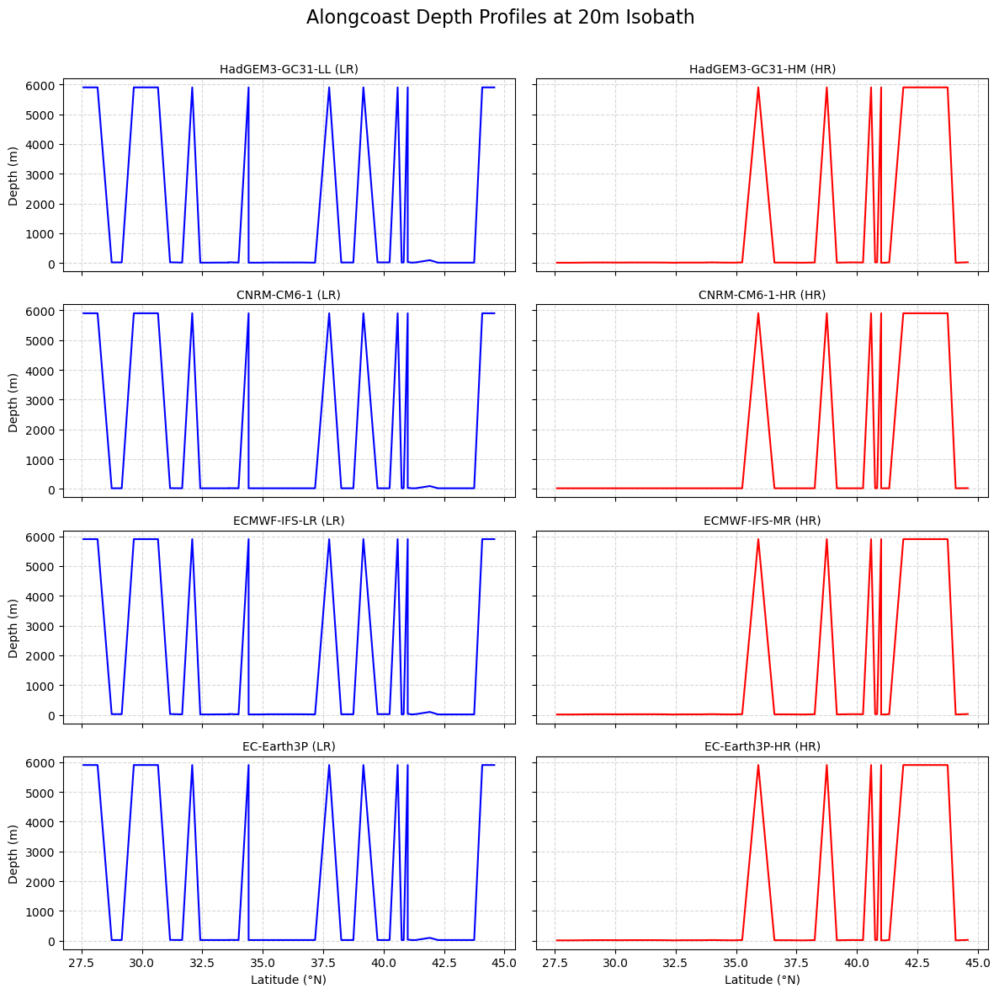

In [44]:
# Nearest interpolation that also returns lat/lon of used grid points
def interpolate_nearest_with_coords(field, lat_grid, lon_grid, tg_lat, tg_lon):
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    values_flat = field.flatten()

    # Mask valid data
    mask = ~np.isnan(values_flat) & ~np.isnan(lat_flat) & ~np.isnan(lon_flat)
    lat_valid = lat_flat[mask]
    lon_valid = lon_flat[mask]
    val_valid = values_flat[mask]

    # Interpolated values (nearest)
    interp_vals = griddata(
        points=(lat_valid, lon_valid),
        values=val_valid,
        xi=(tg_lat, tg_lon),
        method="nearest"
    )

    # Closest lat/lon grid points
    interp_coords = []
    for lat_pt, lon_pt in zip(tg_lat, tg_lon):
        dists = np.sqrt((lat_valid - lat_pt)**2 + (lon_valid - lon_pt)**2)
        idx = np.argmin(dists)
        interp_coords.append((lat_valid[idx], lon_valid[idx]))

    interp_lats, interp_lons = zip(*interp_coords)
    return interp_vals, np.array(interp_lats), np.array(interp_lons)

def drop_duplicate_coords(values, lat, lon):
    coords = np.column_stack((lat, lon))
    _, unique_idx = np.unique(coords, axis=0, return_index=True)
    unique_idx = np.sort(unique_idx)  # preserve original order
    return values[unique_idx], lat[unique_idx], lon[unique_idx]


iso_20_df = isobath_dfs[20]
lons_360 = np.mod(iso_20_df["longitude"].values, 360)
sorter = np.argsort(iso_20_df["latitude"].values)
lat_sorted = iso_20_df["latitude"].values[sorter]

import matplotlib.pyplot as plt

# Create figure with 4 rows (one per model pair), 2 columns (LR, HR)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle("Alongcoast Depth Profiles at 20m Isobath", fontsize=16)

# Loop through 4 model pairs
for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    label = f"{source_ids[i_lr]} vs {source_ids[i_hr]}"

    # --- LR model depth and coordinates ---
    depth_LR_field = depth_maps[i_lr]["lev"]
    lat_LR = depth_LR_field["latitude"].values
    lon_LR = depth_LR_field["longitude"].values
    depth_LR_vals = depth_LR_field.values

    # Remove duplicates in LR coordinates
    depth_LR_vals, lat_LR_clean, lon_LR_clean = drop_duplicate_coords(depth_LR_vals, lat_LR, lon_LR)

    # --- HR model depth and coordinates ---
    depth_HR_field = depth_maps[i_hr]["lev"]
    lat_HR = depth_HR_field["latitude"].values
    lon_HR = depth_HR_field["longitude"].values
    depth_HR_vals = depth_HR_field.values

    # Remove duplicates in HR coordinates
    depth_HR_vals, lat_HR_clean, lon_HR_clean = drop_duplicate_coords(depth_HR_vals, lat_HR, lon_HR)

    # Interpolate depth fields
    depth_LR, depth_LR_lat, depth_LR_lon = interpolate_nearest_with_coords(
        depth_LR_vals, lat_LR_clean, lon_LR_clean, iso_20_df["latitude"].values, lons_360)

    depth_HR, depth_HR_lat, depth_HR_lon = interpolate_nearest_with_coords(
        depth_HR_vals, lat_HR_clean, lon_HR_clean, iso_20_df["latitude"].values, lons_360)

    # Sort by latitude
    depth_LR_sorted = depth_LR[sorter]
    depth_HR_sorted = depth_HR[sorter]

    # Plot LR
    ax_lr = axes[n, 0]
    ax_lr.plot(lat_sorted, depth_LR_sorted, color='blue', label='LR')
    ax_lr.set_title(f"{source_ids[i_lr]} (LR)", fontsize=10)
    ax_lr.invert_yaxis()

    # Plot HR
    ax_hr = axes[n, 1]
    ax_hr.plot(lat_sorted, depth_HR_sorted, color='red', label='HR')
    ax_hr.set_title(f"{source_ids[i_hr]} (HR)", fontsize=10)
    ax_hr.invert_yaxis()

    # Axis labels
    if n == 3:
        ax_lr.set_xlabel("Latitude (°N)")
        ax_hr.set_xlabel("Latitude (°N)")
    ax_lr.set_ylabel("Depth (m)")

    # Gridlines
    ax_lr.grid(True, linestyle='--', alpha=0.5)
    ax_hr.grid(True, linestyle='--', alpha=0.5)

# Layout and display
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


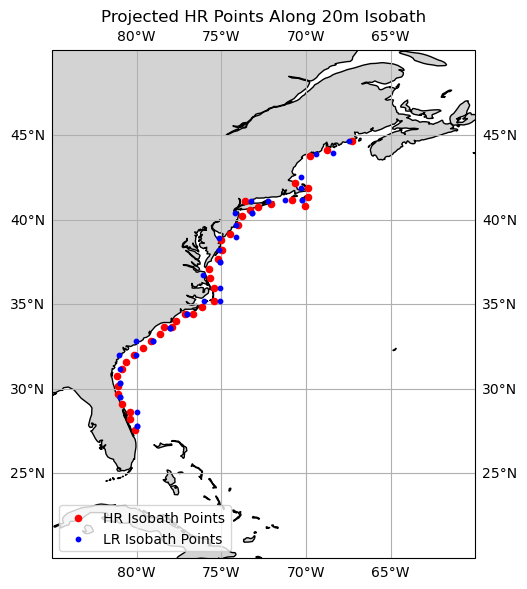

In [50]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Use this if your longitudes are 0–360
hr_lons_plot = np.mod(depth_HR_lon, 360)
hr_lats_plot = depth_HR_lat

lr_lons_plot = np.mod(depth_LR_lon, 360)
lr_lats_plot = depth_LR_lat

# Create a map
fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

# Set extent for US East Coast (adjust if needed)
ax.set_extent([-85, -60, 20, 50], crs=ccrs.PlateCarree())

# Add features
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.gridlines(draw_labels=True)

# Plot HR points
ax.scatter(hr_lons_plot, hr_lats_plot, s=20, color='red', label='HR Isobath Points', zorder=3)
ax.scatter(lr_lons_plot, lr_lats_plot, s=10, color='blue', label='LR Isobath Points', zorder=3)

# Optional: plot LR points for comparison
# ax.scatter(depth_LR_lon, depth_LR_lat, s=20, color='blue', label='LR Isobath Points', zorder=3)

ax.set_title("Projected HR Points Along 20m Isobath")
ax.legend(loc='lower left')

plt.tight_layout()
plt.show()


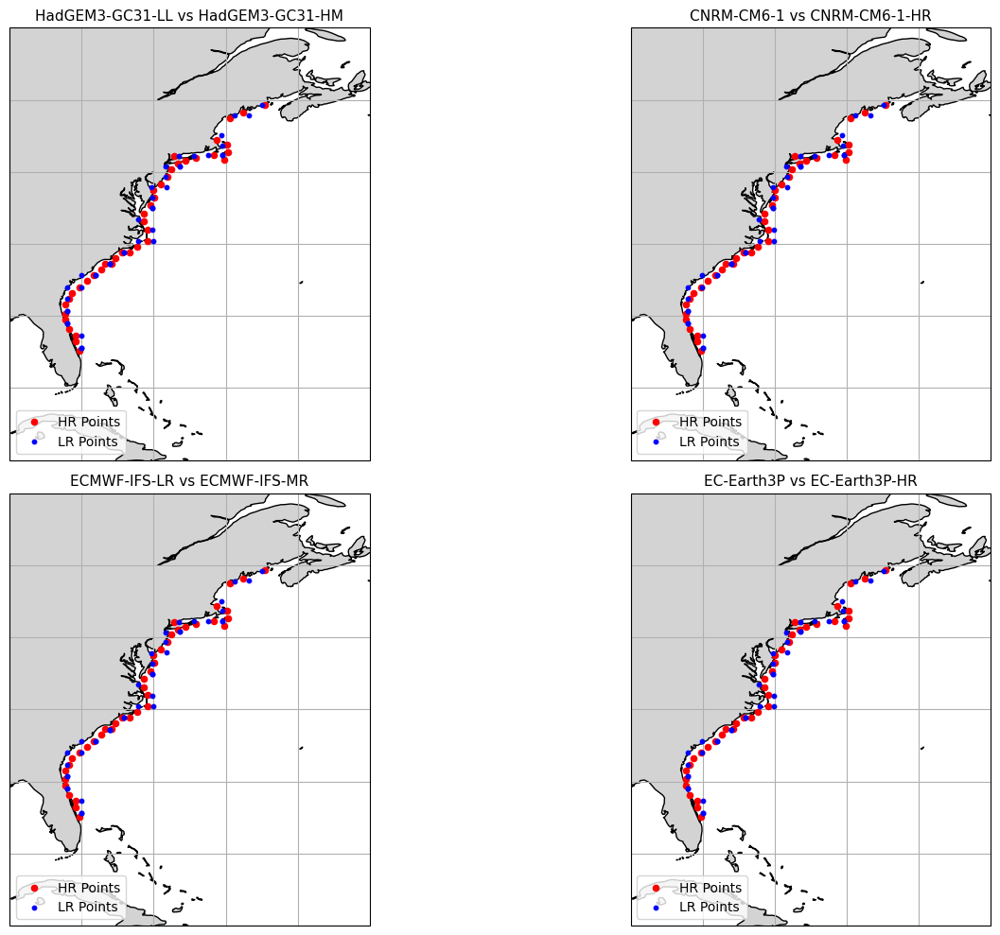

In [51]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Loop through model pairs
for n, (i_lr, i_hr) in enumerate(zip(range(0, 8, 2), range(1, 8, 2))):
    row = n // 2
    col = n % 2
    ax = axes[row, col]

    # Load lat/lon grids
    lat_LR = ds_models_uo[i_lr]["latitude"].values
    lon_LR = ds_models_uo[i_lr]["longitude"].values
    lat_HR = ds_models_uo[i_hr]["latitude"].values
    lon_HR = ds_models_uo[i_hr]["longitude"].values

    # Interpolate to 20m isobath points
    depth_LR, depth_LR_lat, depth_LR_lon = interpolate_nearest_with_coords(
        depth_maps[i_lr]["lev"], lat_LR, lon_LR, iso_20_df["latitude"].values, lons_360)
    depth_HR, depth_HR_lat, depth_HR_lon = interpolate_nearest_with_coords(
        depth_maps[i_hr]["lev"], lat_HR, lon_HR, iso_20_df["latitude"].values, lons_360)

    # Convert longitudes to 0–360
    lr_lons_plot = np.mod(depth_LR_lon, 360)
    hr_lons_plot = np.mod(depth_HR_lon, 360)

    # Plot settings
    ax.set_extent([-85, -60, 20, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.COASTLINE)
    ax.gridlines(draw_labels=False)

    # Scatter plots
    ax.scatter(hr_lons_plot, depth_HR_lat, s=20, color='red', label='HR Points', zorder=3)
    ax.scatter(lr_lons_plot, depth_LR_lat, s=10, color='blue', label='LR Points', zorder=3)

    ax.set_title(f"{source_ids[i_lr]} vs {source_ids[i_hr]}", fontsize=11)
    ax.legend(loc='lower left')

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Example indices for 2 LR and 2 HR models (adjust as needed)
model_indices = [0, 1, 2, 3]  # Replace with your actual LR/HR indices

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for ax, i in zip(axes, model_indices):
    # Extract depth and coordinates
    depth = depth_maps[i]["lev"]
    lat = ds_models_uo[i]["latitude"]
    lon = ds_models_uo[i]["longitude"]

    # Convert longitudes if needed
    lon_vals = np.mod(lon.values, 360) if np.any(lon.values > 180) else lon.values
    lat_vals = lat.values

    # Plot
    mesh = ax.pcolormesh(lon_vals, lat_vals, depth,
                         cmap='viridis', shading='auto',
                         vmin=0, vmax=5000, transform=ccrs.PlateCarree())

    # Scatter plots
    ax.scatter(hr_lons_plot, depth_HR_lat, s=20, color='red', label='HR Points', zorder=3)
    ax.scatter(lr_lons_plot, depth_LR_lat, s=10, color='blue', label='LR Points', zorder=3)


    # Map features
    ax.set_extent([-85, -60, 20, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.COASTLINE, edgecolor='black')
    ax.set_title(f"{source_ids[i]} Depth", fontsize=10)

# Add colorbar
cbar = fig.colorbar(mesh, ax=axes, orientation='horizontal', fraction=0.05, pad=0.05)
cbar.set_label("Bottom Depth (m)")

plt.tight_layout()
plt.show()


### Rough Work

In [ ]:
i = 8

In [75]:
cape_lat = 35.2
cape_lon = -75.5  # Convert to 0–360 if needed

In [76]:
if ds_models_vo[i].longitude.max() > 180:
    cape_lon = (cape_lon + 360) % 360
    
print(cape_lon)

IndexError: list index out of range

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

# Extract 2D lat/lon grid
lat2d = ds_models_vo[i]["latitude"].values
lon2d = ds_models_vo[i]["longitude"].values

# Flatten grid for KDTree (assumes 2D)
lat_flat = lat2d.flatten()
lon_flat = lon2d.flatten()

points = np.column_stack((lat_flat, lon_flat))
tree = cKDTree(points)

# Query the nearest neighbor
dist, idx = tree.query([cape_lat, cape_lon])
j_idx, i_idx = np.unravel_index(idx, lat2d.shape)

print(f"Nearest grid point to Cape Hatteras: (j={j_idx}, i={i_idx})")

IndexError: list index out of range

In [ ]:
vo_profile = ds_models_vo[i]["vo"][:, j_idx, i_idx]
lev = ds_models_vo[i]["lev"].values

In [78]:
vo_profile

<xarray.DataArray 'vo' (lev: 75)>
array([0.13587955, 0.1337862 , 0.13176584, 0.12982793, 0.1279356 ,
       0.12609085, 0.12416384, 0.1220061 , 0.11924957,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan],
      dtype=float32)
Coordinates:
  * lev        (lev) float64 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
    i          int32 650
    j          int32 848
    latitude   float32 35.12
    longitude  float32 284.5

IndexError: list index out of range

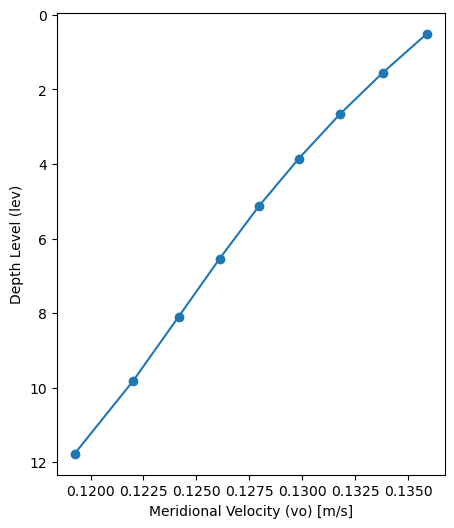

In [79]:
plt.figure(figsize=(5, 6))
plt.plot(vo_profile, lev, marker='o')
plt.gca().invert_yaxis()
plt.xlabel("Meridional Velocity (vo) [m/s]")
plt.ylabel("Depth Level (lev)")
plt.title(f'{source_ids[i]} vo Vertical Profile at Cape Hatteras')
plt.grid(True)
plt.tight_layout()
plt.show()